In [1]:
from PyHugeGraph import PyHugeGraphClient
from helper.insert_data import insert_data
from helper.delete_data import delete_data
from helper.update_data import update_data
from helper.traversers import traversers
from helper.read_data import read_data
import matplotlib.pyplot as plt
import numpy as np

from helper import get_vertices_number

def mapping(l, key_1, key_2):
    return list(map(lambda x: x[key_1][key_2], l))


databases = ['node_10', 'node_100', 'node_1000', 'node_10000', 'node_100000', 'node_1000000']

In [2]:

import os
my_path = os.path.abspath(".")
print(my_path)

/home/admin1/Documents/uni/last_lambda/hugegraph/CompareGraphDatabases/main_code


In [3]:
def plot(title, x_labels, X_axis, time, option="vertices", database="node_10"):
    plt.figure(figsize=(10,10))
    plt.title(title)

    plt.xticks(X_axis, x_labels) #, rotation=45
    plt.bar(X_axis - 0.4, mapping(time, option, "min"), 0.4, label="min")
    plt.bar(X_axis, mapping(time, option, "mean"), 0.4, label="mean")
    plt.bar(X_axis + 0.4, mapping(time, option, "max"), 0.4, label="max")
    
    plt.savefig(my_path + "/plots/" + database + "/" + title + ".png")
    plt.legend()


In [4]:
def execute_database(database, large=True, time=None):
    hg = PyHugeGraphClient.HugeGraphClient("http://localhost", "8081", database)
    
    vertices = get_vertices_number(database, False)

    file = open(database + ".txt", 'r')
    lines = file.readlines()
    if time == None:
        time = []

    if not large:
        time.append(insert_data.insert_data(lines, hg))
        time.append(update_data.update_data(hg, vertices))
        time.append(update_data.update_gremlin(database, vertices))
        time.append(update_data.batch_update(hg=hg, lines=lines, NUMBER_OF_VERTICES=vertices, batch_vertices=200, batch_edges=50, percentage=None))
        time.append(read_data.read_data(hg=hg, NUMBER_OF_VERTICES=vertices))
        time.append(read_data.read_gremlin(database, vertices, True))
        time.append(delete_data.delete_data(hg=hg, NUMBER_OF_vertices=vertices))
        time.append(insert_data.batch_insert(hg=hg, lines=lines, NUMBER_OF_VERTICES=vertices, batch_vertices=200, batch_edges=50))
        time.append(delete_data.delete_gremlin_alltogether(database, vertices))
            
        x_labels = ["insert", "update", "upd_gremlin", "batch_upd", "read", "rd_gremlin", "delete", "batch_insert", "del_gremlin"]
    else:
        time.append(insert_data.batch_insert(hg=hg, lines=lines, NUMBER_OF_VERTICES=vertices, batch_vertices=200, batch_edges=50))
        time.append(update_data.batch_update(hg=hg, lines=lines[:30002], NUMBER_OF_VERTICES=10000, batch_vertices=200, batch_edges=50, percentage=None))
        time.append(read_data.read_data(hg=hg, NUMBER_OF_VERTICES=100))
        time.append(delete_data.delete_data(hg, NUMBER_OF_vertices=100, direction="BOTH"))
        x_labels = ["batch_insert", "batch_update", "read", "delete"]

    X_axis = np.arange(len(x_labels))*2

    plot("Basic sequence on " + database + ": Vertices", x_labels, X_axis, time, "vertices", database)
    plot("Basic sequence on " + database + ": Edges", x_labels, X_axis, time, "edges", database)

    if not large:
        x_labels = ["insert", "batch insert"]
        X_axis = np.arange(len(x_labels))*2
        data = [time[0], time[7]]
        plot("Insert times on " + database + ": Vertices", x_labels, X_axis, data, "vertices", database)
        plot("Insert times on " + database + ": Edges", x_labels, X_axis, data, "edges", database)

        x_labels = ["read", "rd_gremlin"]
        X_axis = np.arange(len(x_labels))*2
        data = [time[4], time[5]]
        plot("Read times on " + database + ": Vertices", x_labels, X_axis, data, "vertices", database)
        plot("Read times on " + database + ": Edges", x_labels, X_axis, data, "edges", database)

        x_labels = ["update", "upd_gremlin", "batch_upd"]
        X_axis = np.arange(len(x_labels))*2
        data = [time[1], time[2], time[3]]
        plot("Update times on " + database + ": Vertices", x_labels, X_axis, data, "vertices", database)
        plot("Update times on " + database + ": Edges", x_labels, X_axis, data, "edges", database)

        x_labels = ["delete", "del_gremlin"]
        X_axis = np.arange(len(x_labels))*2
        data = [time[6], time[8]]
        plot("Delete times on " + database + ": Vertices", x_labels, X_axis, data, "vertices", database)
        plot("Delete times on " + database + ": Edges", x_labels, X_axis, data, "edges", database)
    
    plt.show()
    if not large:
        return {
            "insert": time[0],
            "update": time[1],
            "update_gremlin": time[2],
            "batch_update": time[3],
            "read": time[4],
            "read_gremlin": time[5],
            "delete": time[6],
            "batch_insert": time[7],
            "delete_gremlin": time[8],
        }
    else:
        return {
            "batch insert": time[0],
            "batch update": time[1],
            "read": time[2],
            "delete": time[3],
        }

tqdm() Progress Bar: 100%|██████████| 1/1 [00:00<00:00, 30.41it/s]


length = 32


tqdm() Progress Bar: 100%|██████████| 1/1 [00:00<00:00, 63.63it/s]


length = 32


tqdm() Progress Bar: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


{'requestId': '78593268-45e3-4618-8e66-75cca227de13', 'status': {'message': '', 'code': 200, 'attributes': {}}, 'result': {'data': [], 'meta': {}}}


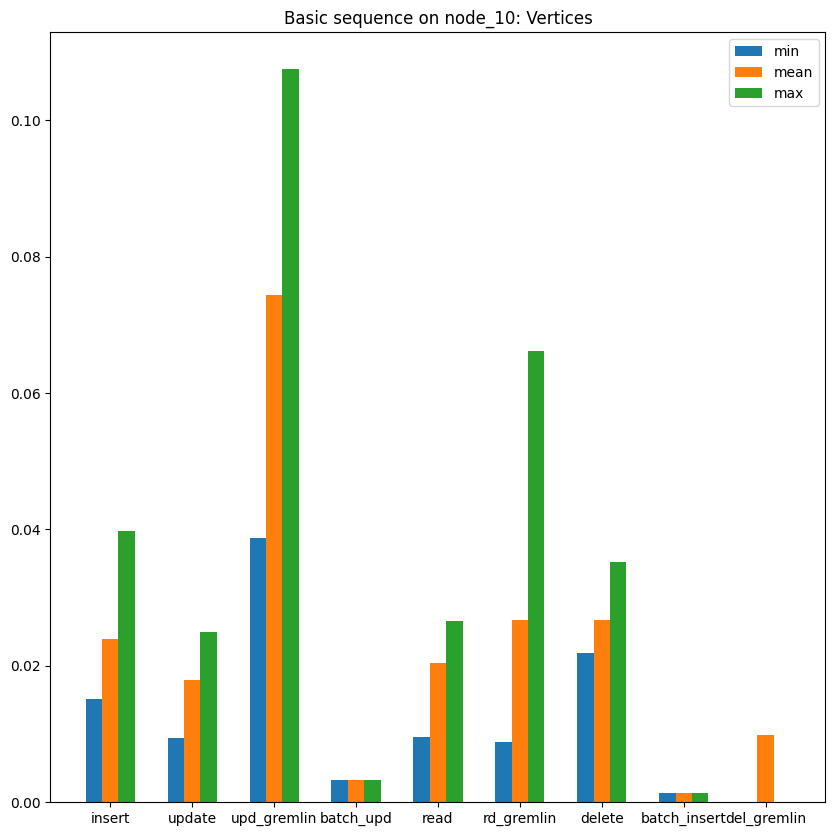

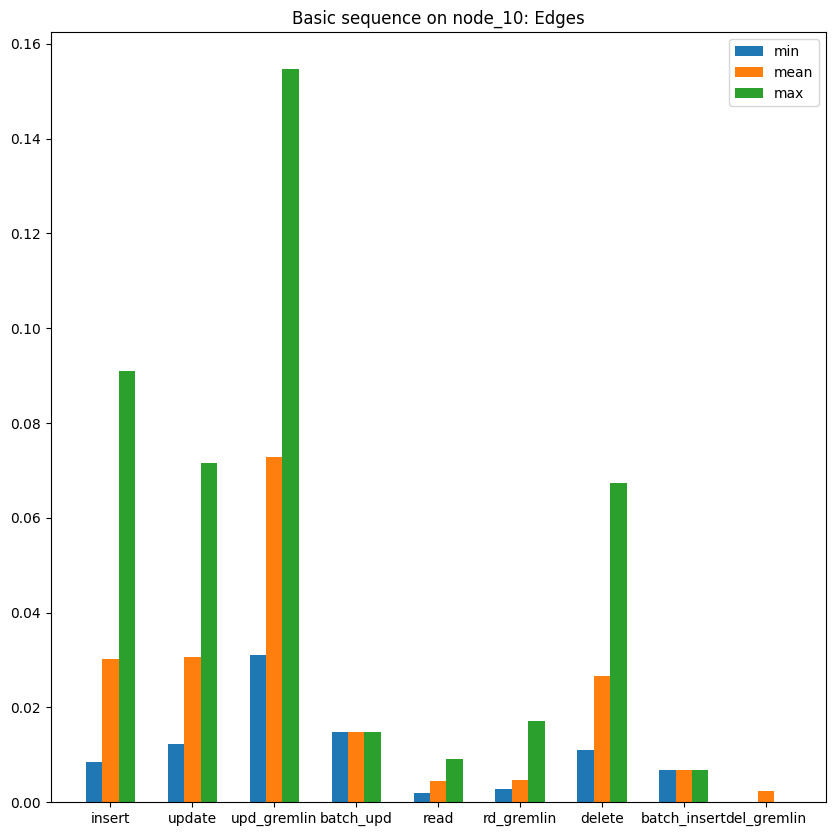

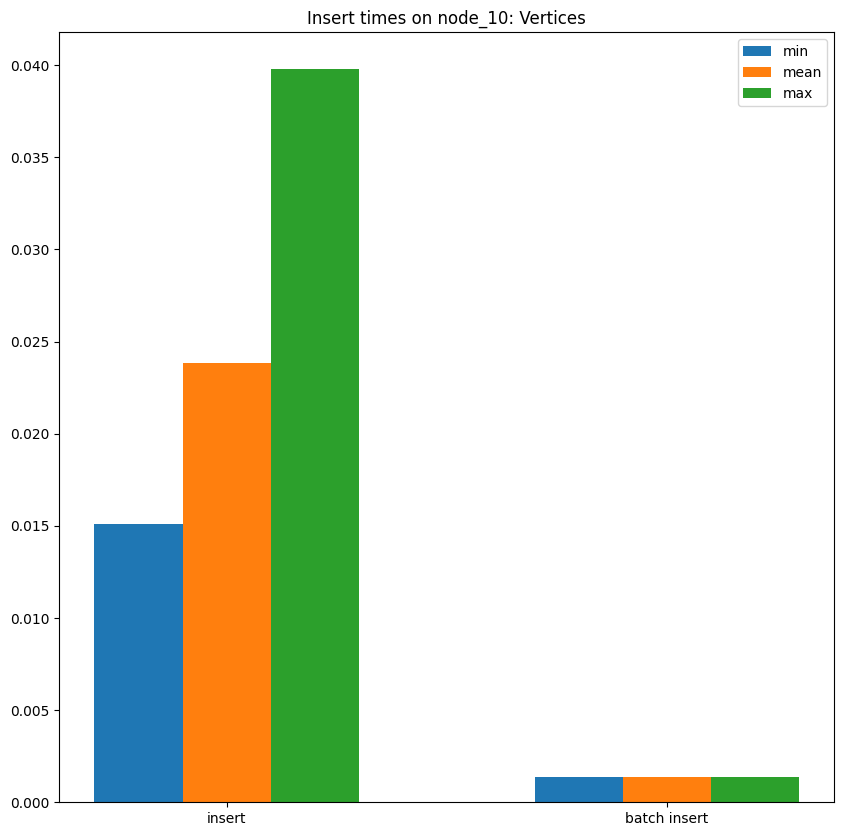

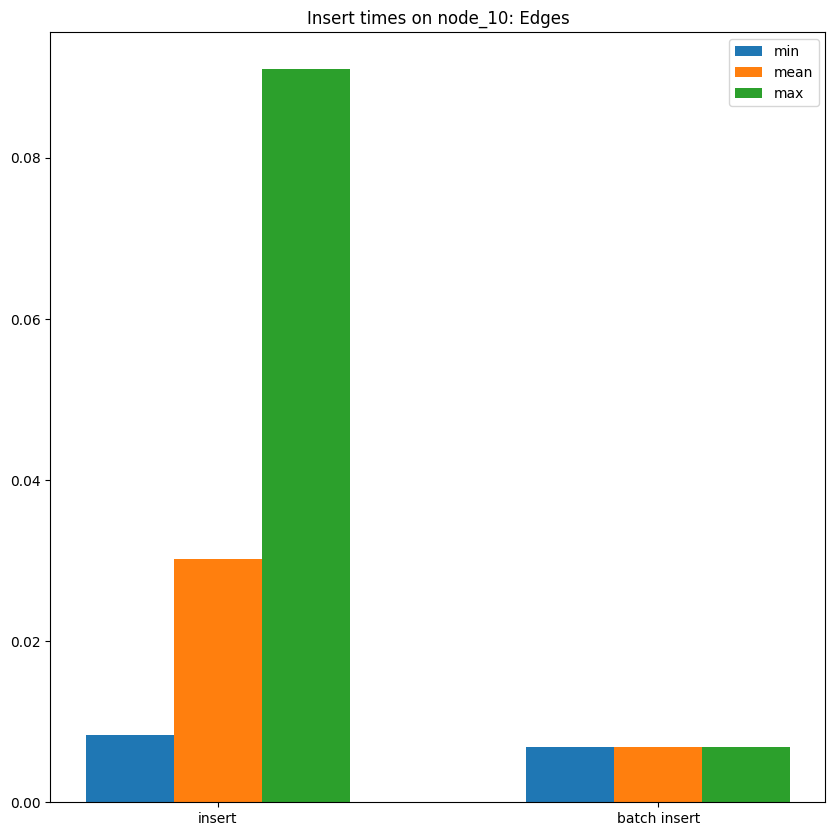

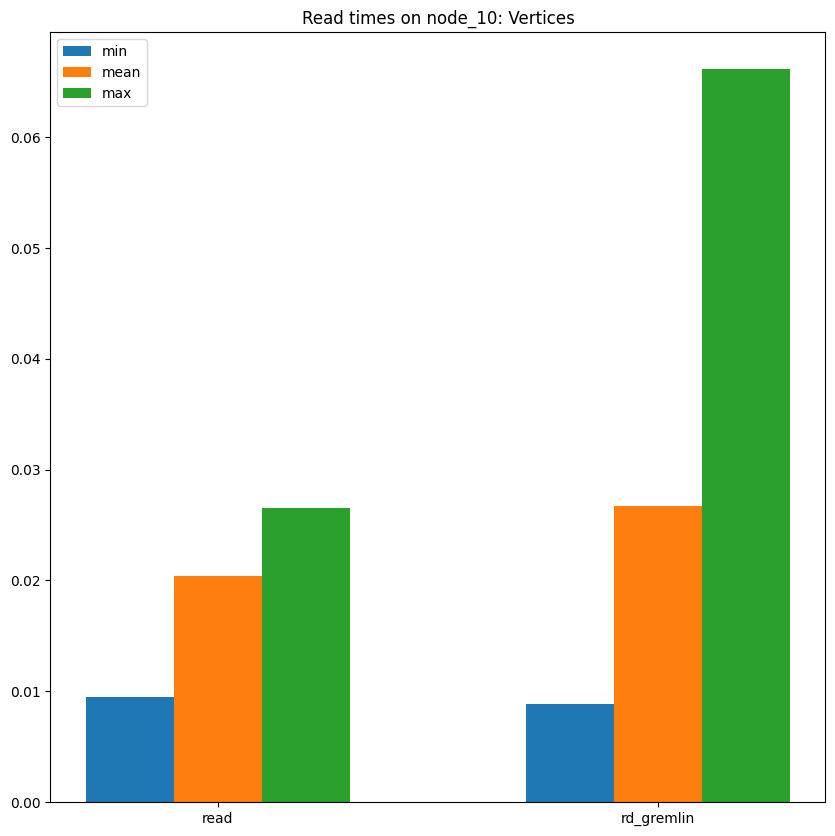

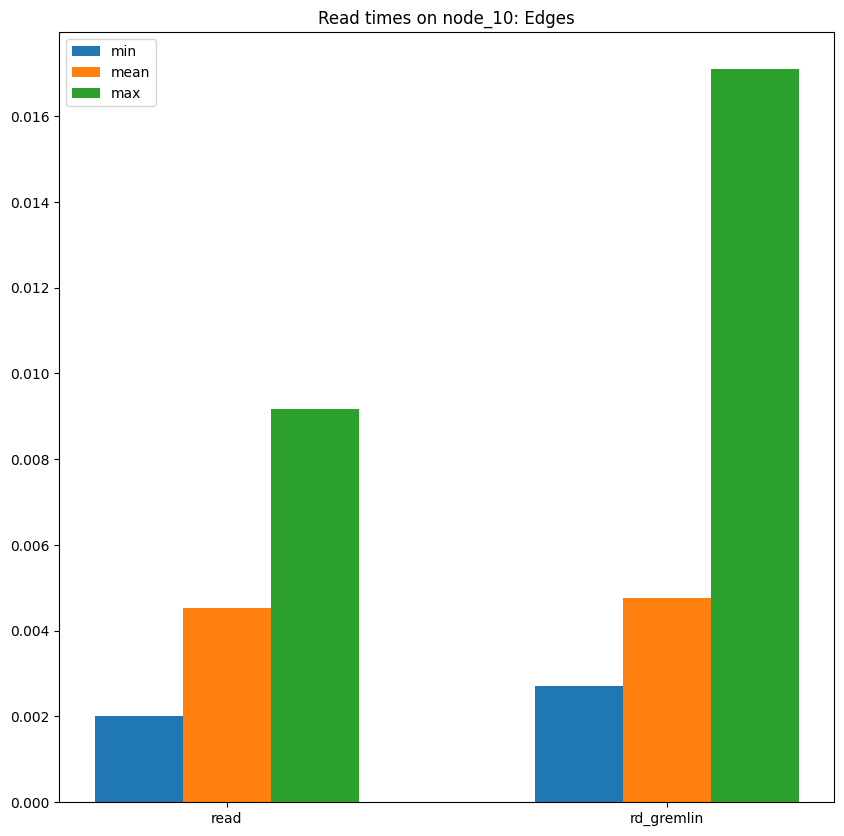

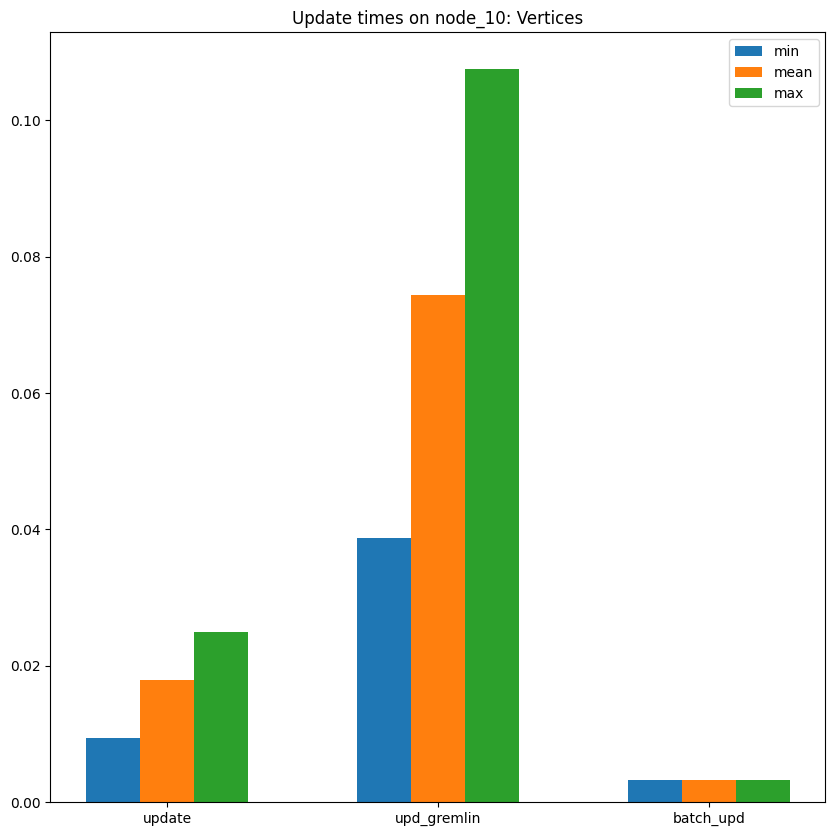

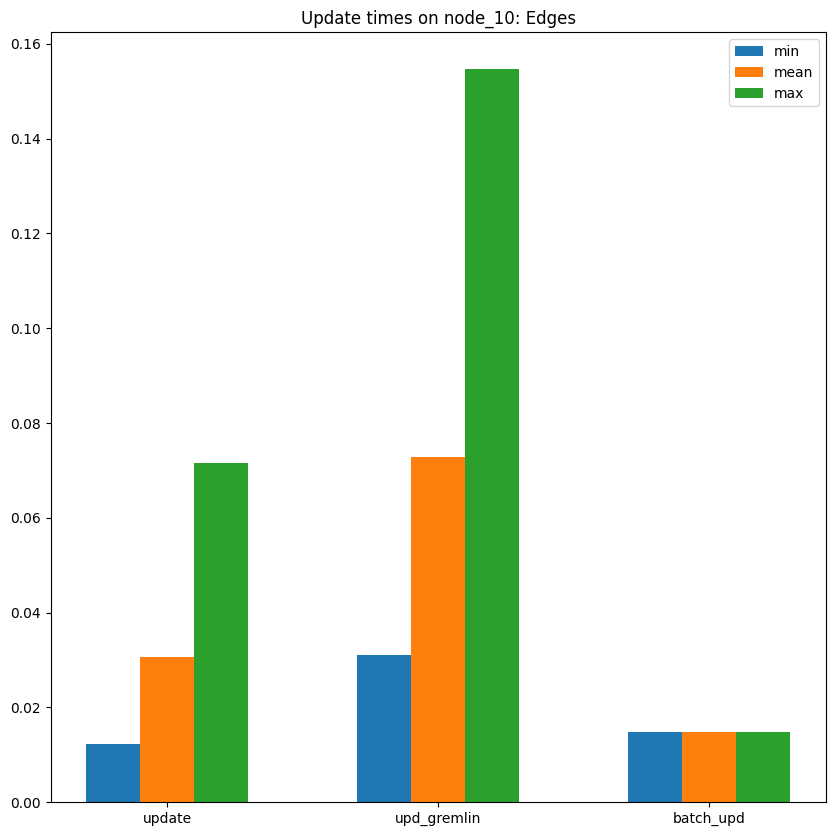

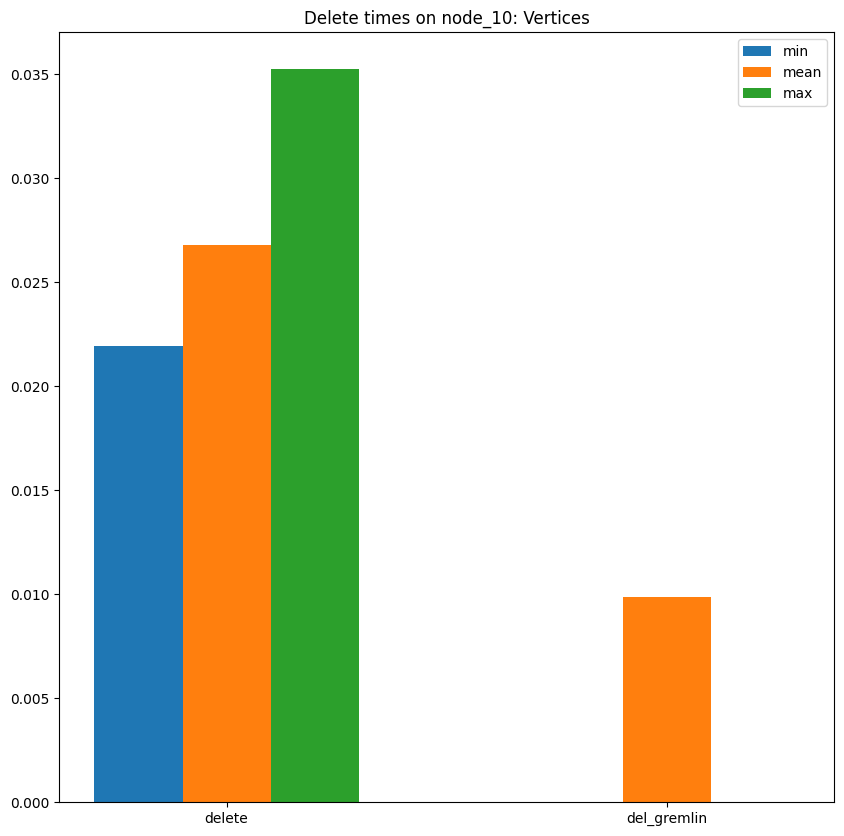

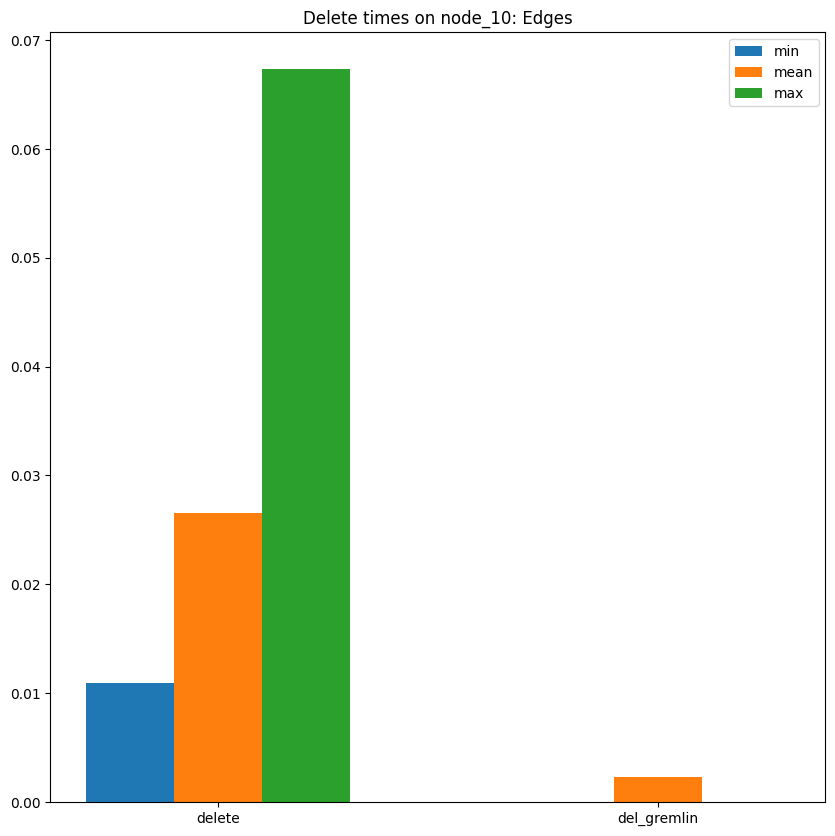

db: node_10
{'insert': {'vertices': {'mean': 0.02386167049407959, 'max': 0.03979897499084473, 'min': 0.015088319778442383, 'number_of_vertices': 10}, 'edges': {'mean': 0.030145128568013508, 'max': 0.09104418754577637, 'min': 0.008405208587646484, 'number_of_edges': 60}, 'total_time': 2.056764841079712}, 'update': {'edges': {'mean': 0.030609496434529624, 'max': 0.0714716911315918, 'min': 0.01232147216796875, 'total_time': 2.132660388946533}, 'vertices': {'mean': 0.01796395778656006, 'max': 0.024976253509521484, 'min': 0.009467840194702148, 'total_time': 0.17992258071899414}}, 'update_gremlin': {'edges': {'edges_updated': 60, 'min': 0.03110504150390625, 'max': 0.15471935272216797, 'mean': 0.07282851934432984, 'total_time': 4.617216110229492}, 'vertices': {'min': 0.038802385330200195, 'max': 0.10755705833435059, 'mean': 0.0744466781616211, 'total_time': 0.7448296546936035}}, 'batch_update': {'vertices': {'max': 0.0032557249069213867, 'min': 0.0032557249069213867, 'mean': 0.003255724906921

In [7]:
results = {}

results["node_10"] = execute_database("node_10", large=False)
print("db:", "node_10")
print(results["node_10"])

In [8]:
results = {}

results["node_100"] = execute_database("node_100", large=False)
print("db:", "node_100")
print(results["node_100"])

tqdm() Progress Bar: 100%|██████████| 5/5 [00:00<00:00, 28.67it/s]


length = 59589


tqdm() Progress Bar: 100%|██████████| 1192/1192 [01:36<00:00, 12.29it/s]


OUT
100 OUT
[{'id': 'S1:23>1>>S1:10', 'label': 'relationship', 'type': 'edge', 'outV': '1:23', 'outVLabel': 'person', 'inV': '1:10', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '23 -> 10'}}, {'id': 'S1:23>1>>S1:24', 'label': 'relationship', 'type': 'edge', 'outV': '1:23', 'outVLabel': 'person', 'inV': '1:24', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '23 -> 24'}}, {'id': 'S1:23>1>>S1:35', 'label': 'relationship', 'type': 'edge', 'outV': '1:23', 'outVLabel': 'person', 'inV': '1:35', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '23 -> 35'}}, {'id': 'S1:23>1>>S1:36', 'label': 'relationship', 'type': 'edge', 'outV': '1:23', 'outVLabel': 'person', 'inV': '1:36', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '23 -> 36'}}, {'id': 'S1:23>1>>S1:47', 'label': 'relationship', 'type': 'edge', 'outV': '1:23', 'outVLabel': 'person', 'inV': '1:47', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '23 -> 47'}}, {'id': 'S1:23>1>

tqdm() Progress Bar: 100%|██████████| 5/5 [00:00<00:00, 43.85it/s]


length = 59589


tqdm() Progress Bar: 100%|██████████| 1192/1192 [00:29<00:00, 40.78it/s]


{'exception': 'class jakarta.ws.rs.ProcessingException', 'message': 'java.net.SocketTimeoutException: Read timed out', 'cause': 'java.net.SocketTimeoutException: Read timed out'}


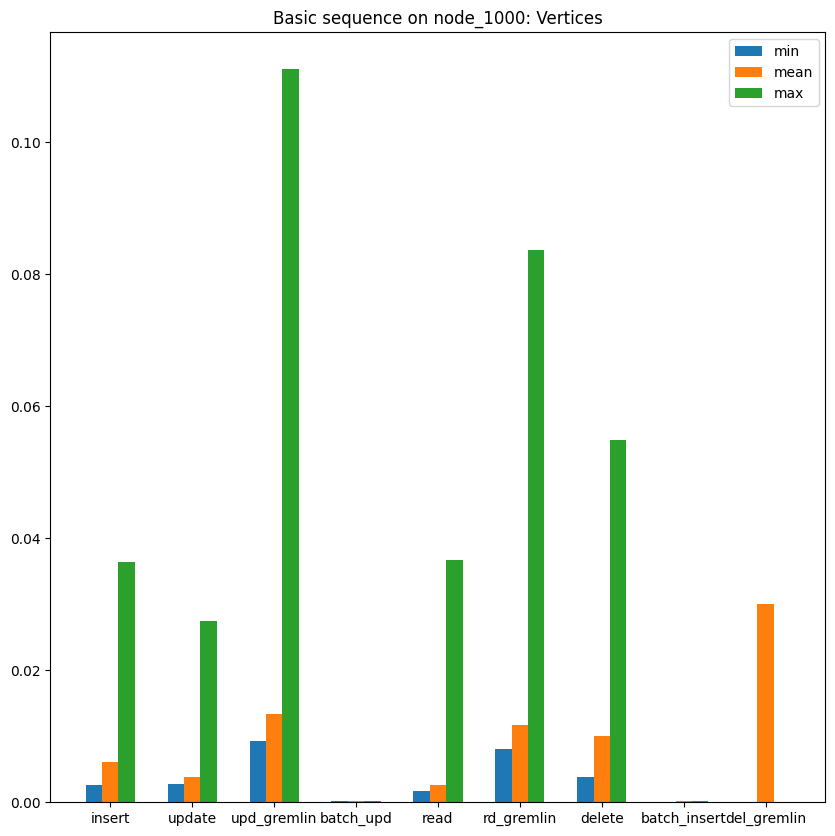

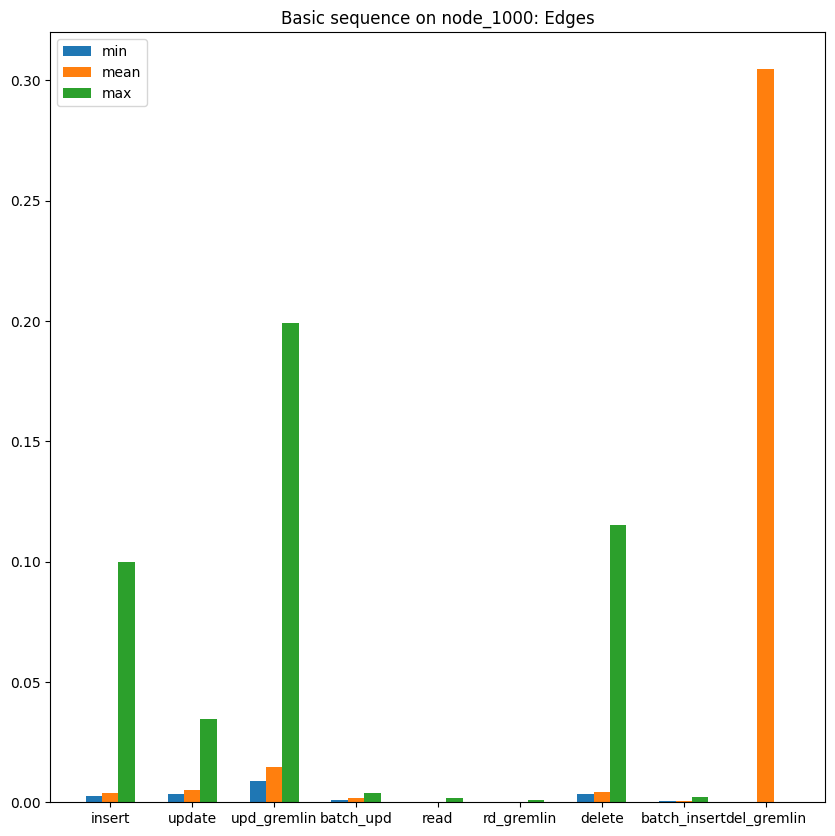

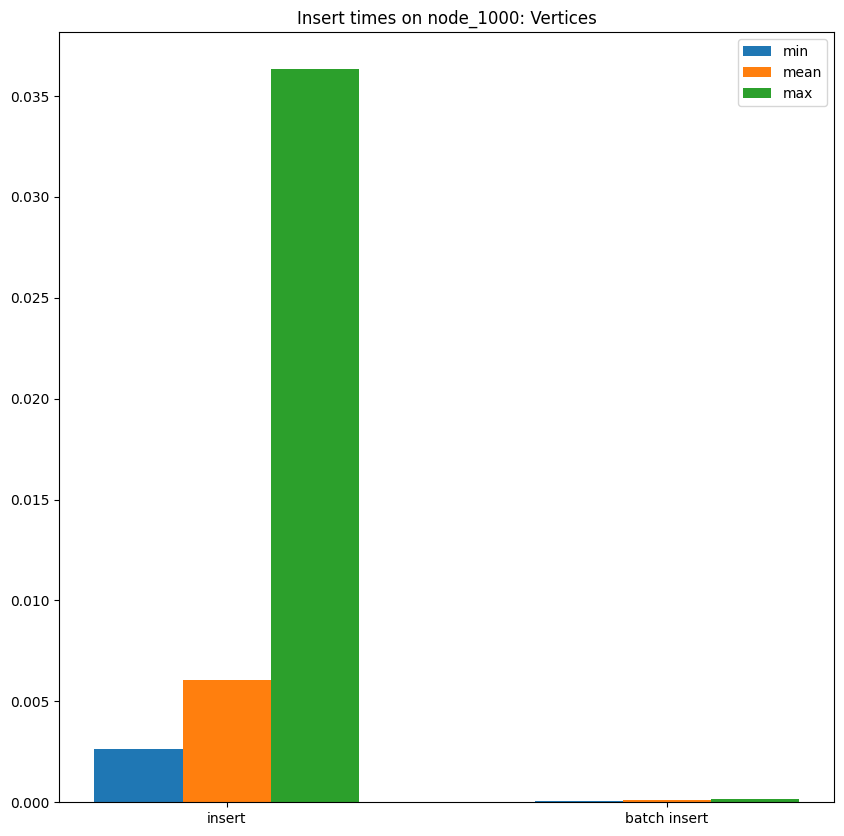

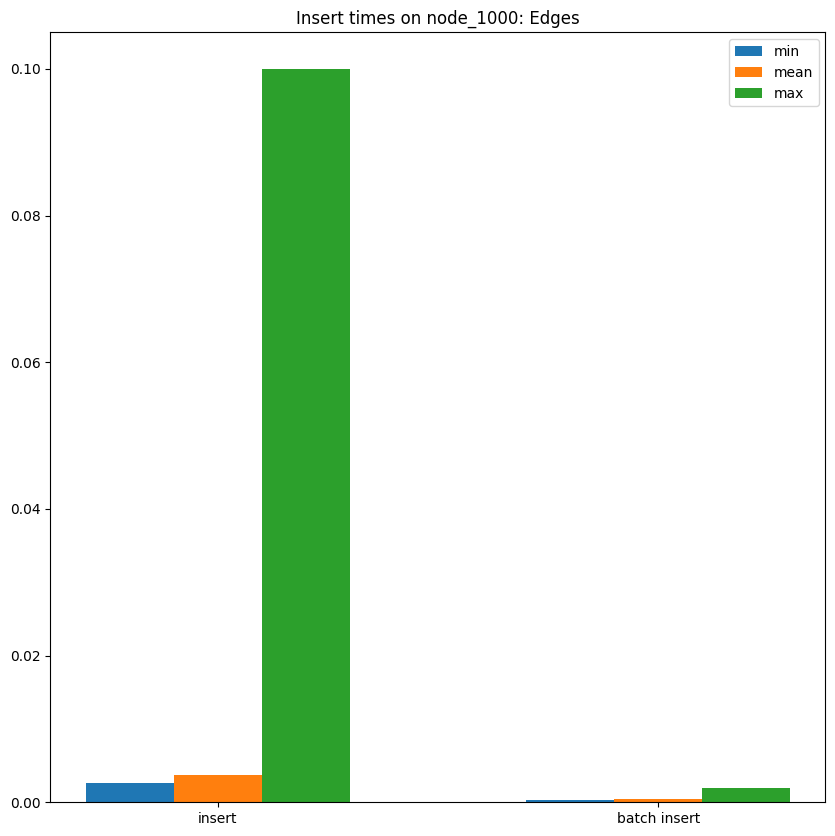

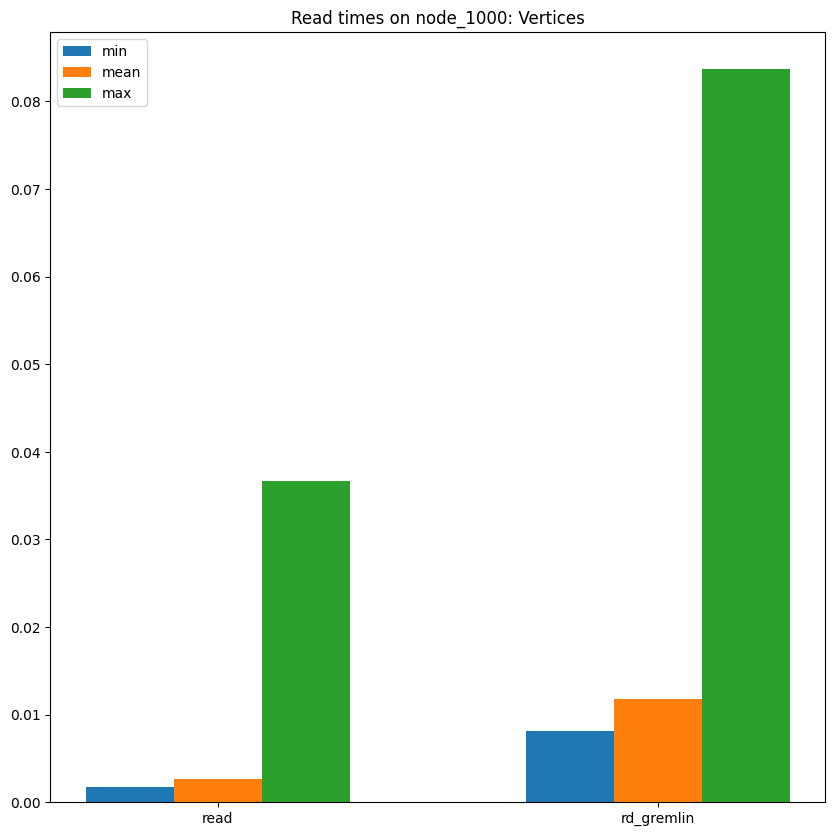

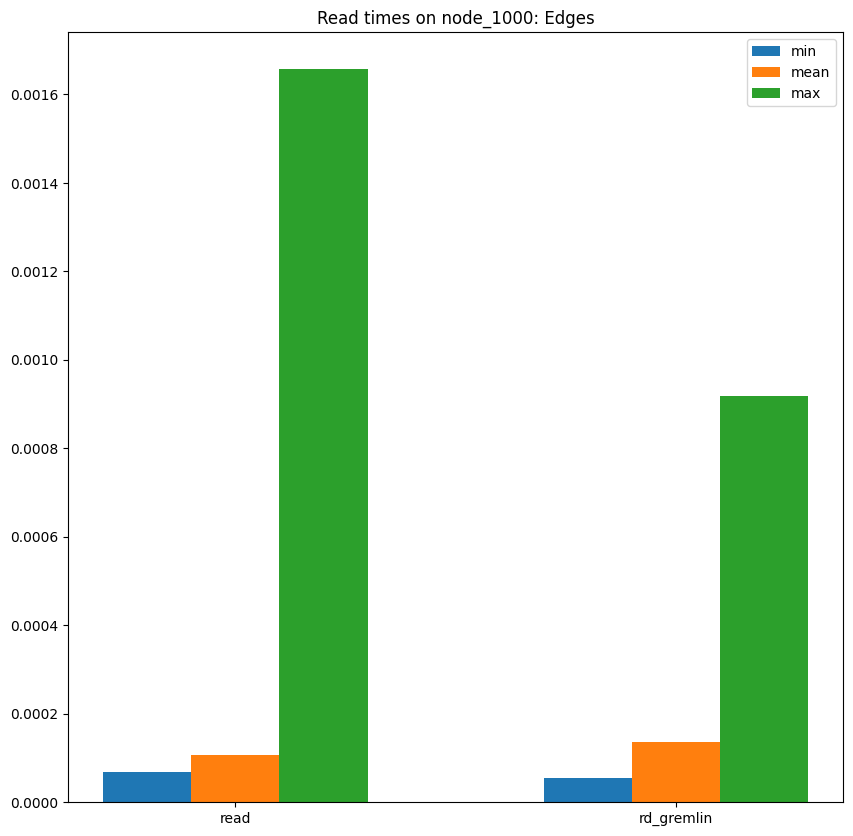

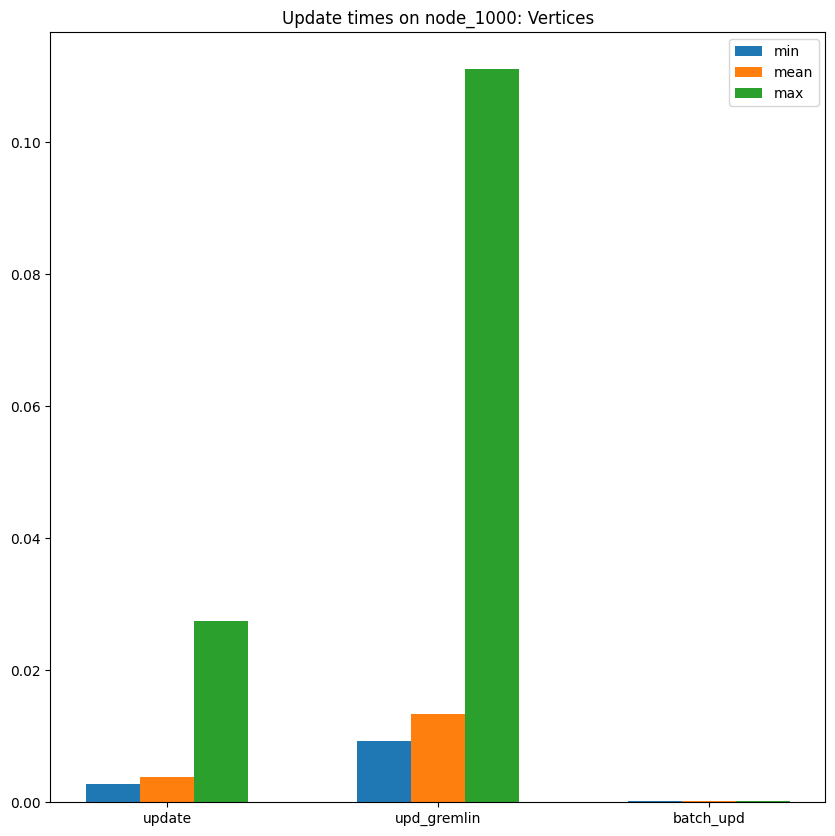

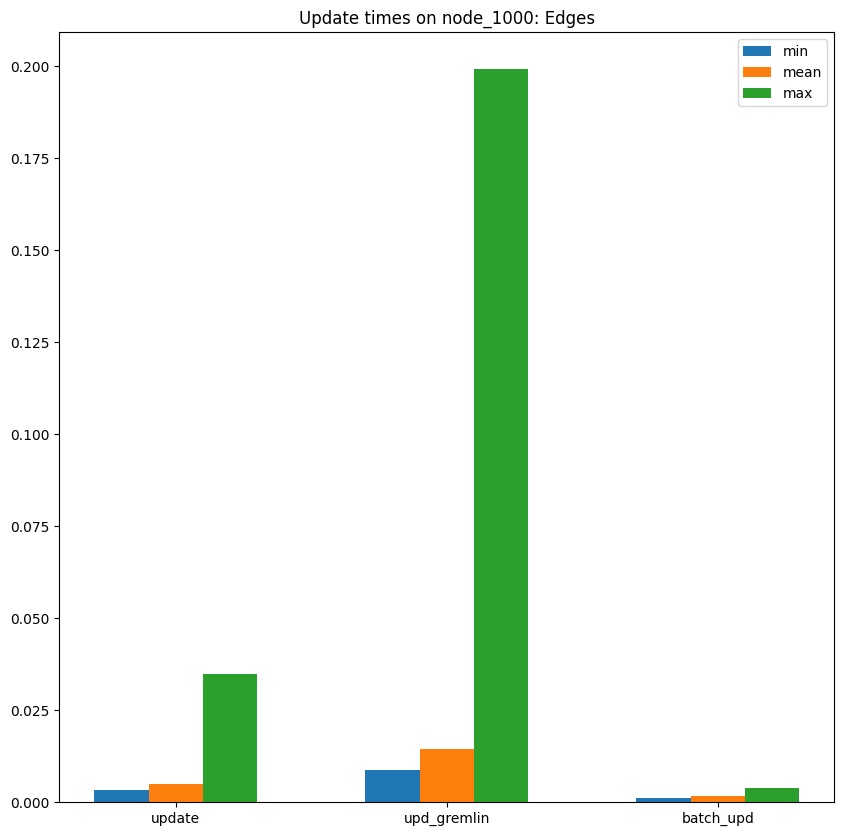

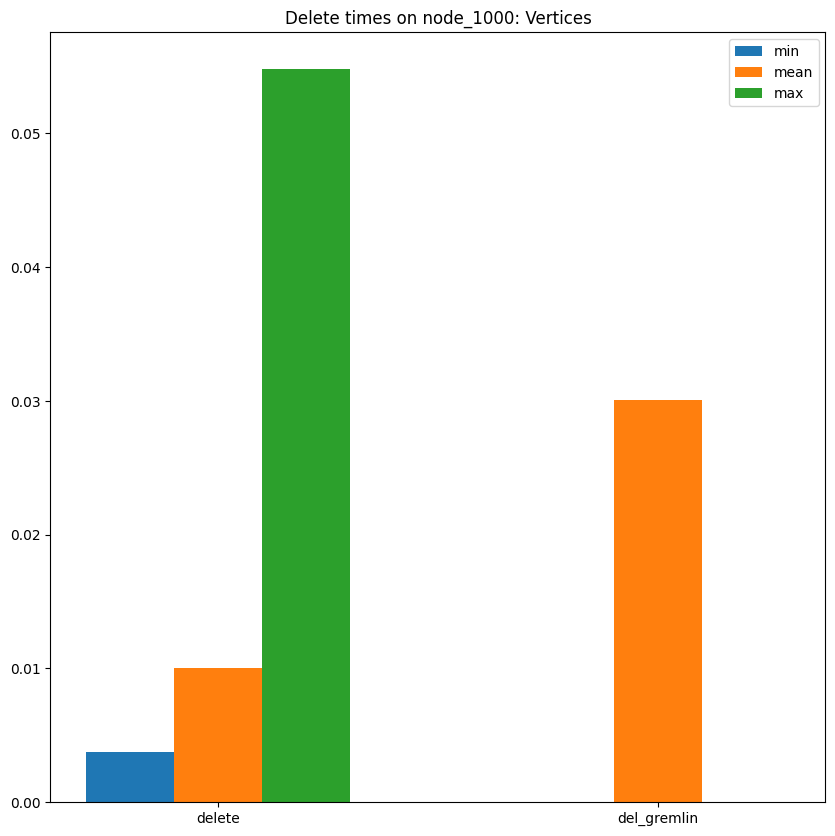

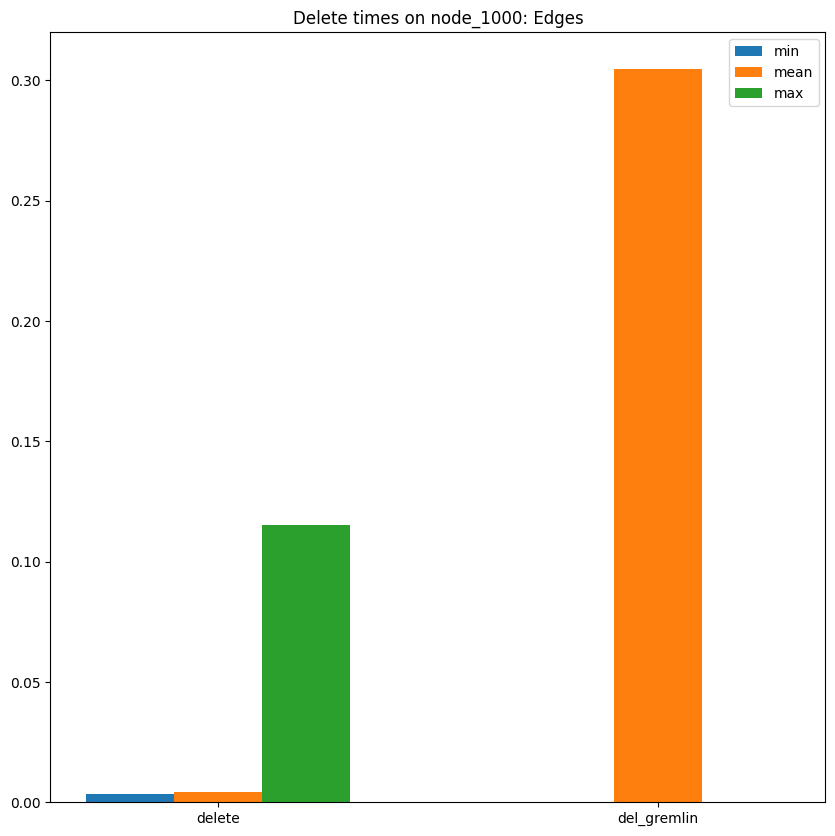

db: node_1000
{'insert': {'vertices': {'mean': 0.006056375675029926, 'max': 0.03634357452392578, 'min': 0.0026540756225585938, 'number_of_vertices': 1001}, 'edges': {'mean': 0.0036905247768173103, 'max': 0.09999275207519531, 'min': 0.0026366710662841797, 'number_of_edges': 119174}, 'total_time': 447.005526304245}, 'update': {'edges': {'mean': 0.0048865538039328865, 'max': 0.03474617004394531, 'min': 0.0034029483795166016, 'total_time': 423.5219740867615}, 'vertices': {'mean': 0.0037917368412017823, 'max': 0.027504920959472656, 'min': 0.0027489662170410156, 'total_time': 3.801905870437622}}, 'update_gremlin': {'edges': {'edges_updated': 111985, 'min': 0.008771657943725586, 'max': 0.1991884708404541, 'mean': 0.01455696091437098, 'total_time': 1652.5665256977081}, 'vertices': {'min': 0.00929403305053711, 'max': 0.11112117767333984, 'mean': 0.013386111259460449, 'total_time': 13.3968505859375}}, 'batch_update': {'vertices': {'max': 0.00023502707481384277, 'min': 0.00013115644454956055, 'me

In [18]:
results = {}

results["node_1000"] = execute_database("node_1000", large=False)
print("db:", "node_1000")
print(results["node_1000"])

tqdm() Progress Bar: 100%|██████████| 50/50 [00:01<00:00, 44.33it/s]


length = 362894


tqdm() Progress Bar: 100%|██████████| 50/50 [00:01<00:00, 40.35it/s]


length = 30002


tqdm() Progress Bar: 100%|██████████| 600/600 [00:52<00:00, 11.52it/s]


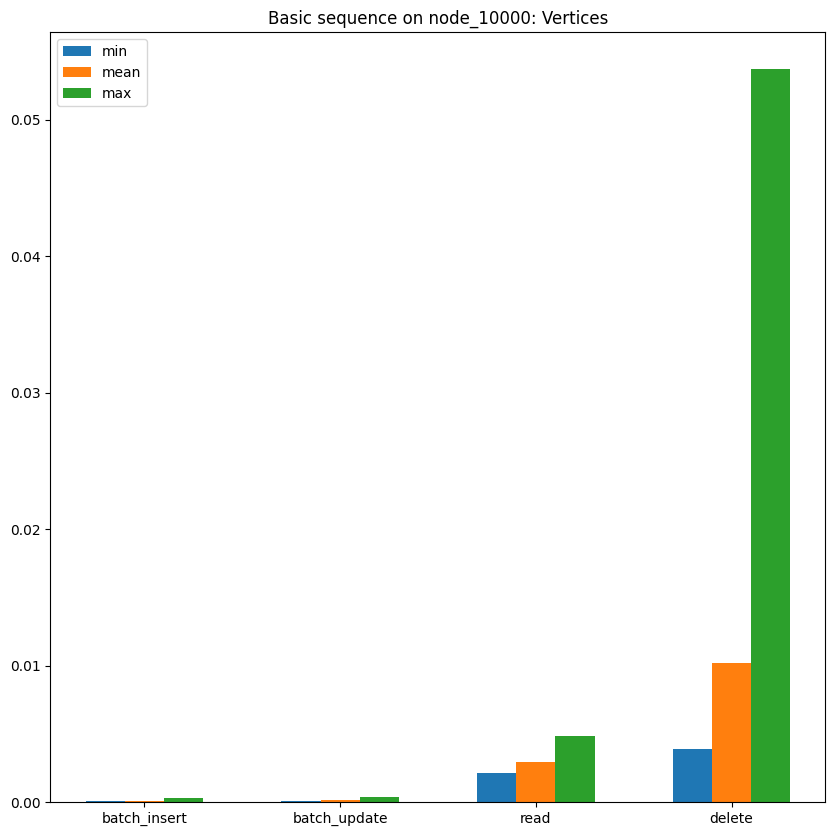

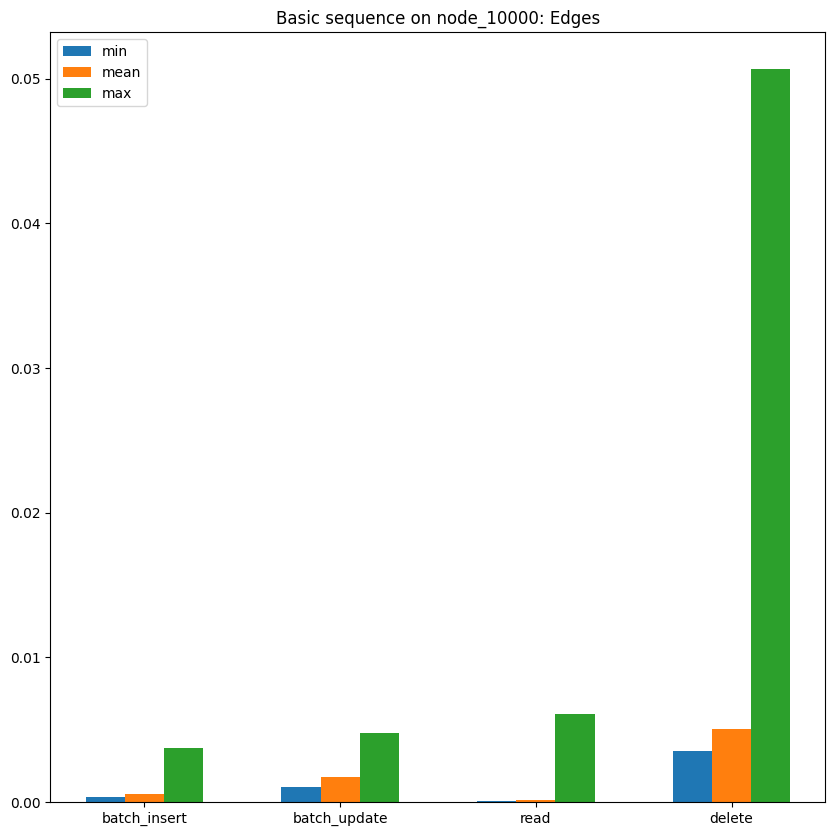

db: node_10000
{'batch insert': {'vertices': {'max': 0.0002738082408905029, 'min': 8.116483688354492e-05, 'mean': 0.00011020047664642334}, 'edges': {'max': 0.0037742042541503906, 'min': 0.00037651538848876954, 'mean': 0.0005384518170855279}}, 'batch update': {'vertices': {'max': 0.0003917229175567627, 'min': 9.209990501403809e-05, 'mean': 0.00012139492034912109}, 'edges': {'max': 0.004759926795959473, 'min': 0.0010234498977661132, 'mean': 0.001717943549156189}}, 'read': {'edges': {'mean': 0.00012852875944351286, 'max': 0.006067514419555664, 'min': 7.43722915649414e-05, 'total_time': 0.7326159477233887}, 'vertices': {'mean': 0.0029763698577880858, 'max': 0.004820823669433594, 'min': 0.0021097660064697266, 'total_time': 0.29805755615234375}}, 'delete': {'edges': {'mean': 0.005053333020743632, 'max': 0.05068325996398926, 'min': 0.003543376922607422, 'total_time': 58.885170698165894}, 'vertices': {'mean': 0.01015746831893921, 'max': 0.05372142791748047, 'min': 0.0038623809814453125, 'total

In [7]:
results = {}

results["node_10000"] = execute_database("node_10000", large=True)
print("db:", "node_10000")
print(results["node_10000"])

In [5]:
results = {}

results["node_100000"] = execute_database("node_100000", large=True)
print("db:", "node_100000")
print(results["node_100000"])

tqdm() Progress Bar: 100%|██████████| 500/500 [00:10<00:00, 45.79it/s]


length = 1414284


tqdm() Progress Bar:   0%|          | 6/7072 [00:01<23:07,  5.09it/s]


AssertionError: Could not insert edge batch: [{'label': 'relationship', 'outV': '1:14', 'inV': '1:26955', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '14 -> 26955'}}, {'label': 'relationship', 'outV': '1:26955', 'inV': '1:14', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '26955 -> 14'}}, {'label': 'relationship', 'outV': '1:14', 'inV': '1:26956', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '14 -> 26956'}}, {'label': 'relationship', 'outV': '1:26956', 'inV': '1:14', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '26956 -> 14'}}, {'label': 'relationship', 'outV': '1:14', 'inV': '1:26957', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '14 -> 26957'}}, {'label': 'relationship', 'outV': '1:26957', 'inV': '1:14', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '26957 -> 14'}}, {'label': 'relationship', 'outV': '1:14', 'inV': '1:26957', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '14 -> 26957'}}, {'label': 'relationship', 'outV': '1:26957', 'inV': '1:14', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '26957 -> 14'}}, {'label': 'relationship', 'outV': '1:14', 'inV': '1:26958', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '14 -> 26958'}}, {'label': 'relationship', 'outV': '1:26958', 'inV': '1:14', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '26958 -> 14'}}, {'label': 'relationship', 'outV': '1:14', 'inV': '1:26958', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '14 -> 26958'}}, {'label': 'relationship', 'outV': '1:26958', 'inV': '1:14', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '26958 -> 14'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:16', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 16'}}, {'label': 'relationship', 'outV': '1:16', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '16 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:17', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 17'}}, {'label': 'relationship', 'outV': '1:17', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '17 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:17', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 17'}}, {'label': 'relationship', 'outV': '1:17', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '17 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:18', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 18'}}, {'label': 'relationship', 'outV': '1:18', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '18 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:18', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 18'}}, {'label': 'relationship', 'outV': '1:18', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '18 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:19', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 19'}}, {'label': 'relationship', 'outV': '1:19', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '19 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:19', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 19'}}, {'label': 'relationship', 'outV': '1:19', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '19 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:22', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 22'}}, {'label': 'relationship', 'outV': '1:22', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '22 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:22', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '15 -> 22'}}, {'label': 'relationship', 'outV': '1:22', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '22 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:27', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '15 -> 27'}}, {'label': 'relationship', 'outV': '1:27', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '27 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:53', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 53'}}, {'label': 'relationship', 'outV': '1:53', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '53 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:53', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 53'}}, {'label': 'relationship', 'outV': '1:53', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '53 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:56', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '15 -> 56'}}, {'label': 'relationship', 'outV': '1:56', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '56 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:71', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 71'}}, {'label': 'relationship', 'outV': '1:71', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '71 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:71', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '15 -> 71'}}, {'label': 'relationship', 'outV': '1:71', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '71 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:87', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '15 -> 87'}}, {'label': 'relationship', 'outV': '1:87', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '87 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:90', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 90'}}, {'label': 'relationship', 'outV': '1:90', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '90 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:94', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 94'}}, {'label': 'relationship', 'outV': '1:94', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '94 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:98', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 98'}}, {'label': 'relationship', 'outV': '1:98', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '98 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:98', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 98'}}, {'label': 'relationship', 'outV': '1:98', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '98 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:99', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '15 -> 99'}}, {'label': 'relationship', 'outV': '1:99', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '99 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:100', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '15 -> 100'}}, {'label': 'relationship', 'outV': '1:100', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '100 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:113', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 113'}}, {'label': 'relationship', 'outV': '1:113', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '113 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:123', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '15 -> 123'}}, {'label': 'relationship', 'outV': '1:123', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '123 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:128', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '15 -> 128'}}, {'label': 'relationship', 'outV': '1:128', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '128 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:151', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 151'}}, {'label': 'relationship', 'outV': '1:151', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '151 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:309', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '15 -> 309'}}, {'label': 'relationship', 'outV': '1:309', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '309 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:320', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 320'}}, {'label': 'relationship', 'outV': '1:320', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '320 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:336', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '15 -> 336'}}, {'label': 'relationship', 'outV': '1:336', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '336 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:451', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 451'}}, {'label': 'relationship', 'outV': '1:451', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '451 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:451', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '15 -> 451'}}, {'label': 'relationship', 'outV': '1:451', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '451 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:469', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '15 -> 469'}}, {'label': 'relationship', 'outV': '1:469', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '469 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:471', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 471'}}, {'label': 'relationship', 'outV': '1:471', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '471 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:509', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 509'}}, {'label': 'relationship', 'outV': '1:509', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '509 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:511', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 511'}}, {'label': 'relationship', 'outV': '1:511', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '511 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:513', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '15 -> 513'}}, {'label': 'relationship', 'outV': '1:513', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '513 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:515', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 515'}}, {'label': 'relationship', 'outV': '1:515', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '515 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:517', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 517'}}, {'label': 'relationship', 'outV': '1:517', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '517 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:518', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 518'}}, {'label': 'relationship', 'outV': '1:518', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '518 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:519', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 519'}}, {'label': 'relationship', 'outV': '1:519', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '519 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:519', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '15 -> 519'}}, {'label': 'relationship', 'outV': '1:519', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '519 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:521', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 521'}}, {'label': 'relationship', 'outV': '1:521', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '521 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:525', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 525'}}, {'label': 'relationship', 'outV': '1:525', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '525 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:532', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 532'}}, {'label': 'relationship', 'outV': '1:532', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '532 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:536', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 536'}}, {'label': 'relationship', 'outV': '1:536', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '536 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:539', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 539'}}, {'label': 'relationship', 'outV': '1:539', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '539 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:539', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 539'}}, {'label': 'relationship', 'outV': '1:539', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '539 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:541', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 541'}}, {'label': 'relationship', 'outV': '1:541', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '541 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:542', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '15 -> 542'}}, {'label': 'relationship', 'outV': '1:542', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '542 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:574', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 574'}}, {'label': 'relationship', 'outV': '1:574', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '574 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:583', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 583'}}, {'label': 'relationship', 'outV': '1:583', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '583 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:738', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 738'}}, {'label': 'relationship', 'outV': '1:738', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '738 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:778', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '15 -> 778'}}, {'label': 'relationship', 'outV': '1:778', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '778 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:780', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 780'}}, {'label': 'relationship', 'outV': '1:780', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '780 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:788', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 788'}}, {'label': 'relationship', 'outV': '1:788', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '788 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:789', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 789'}}, {'label': 'relationship', 'outV': '1:789', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '789 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:814', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 814'}}, {'label': 'relationship', 'outV': '1:814', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '814 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:814', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 814'}}, {'label': 'relationship', 'outV': '1:814', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '814 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1103', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 1103'}}, {'label': 'relationship', 'outV': '1:1103', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '1103 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1189', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 1189'}}, {'label': 'relationship', 'outV': '1:1189', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '1189 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1192', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 1192'}}, {'label': 'relationship', 'outV': '1:1192', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '1192 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1192', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 1192'}}, {'label': 'relationship', 'outV': '1:1192', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '1192 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1194', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '15 -> 1194'}}, {'label': 'relationship', 'outV': '1:1194', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '1194 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1204', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '15 -> 1204'}}, {'label': 'relationship', 'outV': '1:1204', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '1204 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1207', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '15 -> 1207'}}, {'label': 'relationship', 'outV': '1:1207', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '1207 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1209', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '15 -> 1209'}}, {'label': 'relationship', 'outV': '1:1209', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '1209 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1214', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '15 -> 1214'}}, {'label': 'relationship', 'outV': '1:1214', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '1214 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1216', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '15 -> 1216'}}, {'label': 'relationship', 'outV': '1:1216', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '1216 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1219', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 1219'}}, {'label': 'relationship', 'outV': '1:1219', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '1219 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1450', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 1450'}}, {'label': 'relationship', 'outV': '1:1450', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '1450 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1635', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 1635'}}, {'label': 'relationship', 'outV': '1:1635', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '1635 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1637', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 1637'}}, {'label': 'relationship', 'outV': '1:1637', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '1637 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1637', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 1637'}}, {'label': 'relationship', 'outV': '1:1637', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '1637 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1642', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '15 -> 1642'}}, {'label': 'relationship', 'outV': '1:1642', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '1642 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1642', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 1642'}}, {'label': 'relationship', 'outV': '1:1642', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '1642 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1646', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 1646'}}, {'label': 'relationship', 'outV': '1:1646', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '1646 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1646', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 1646'}}, {'label': 'relationship', 'outV': '1:1646', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '1646 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1648', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 1648'}}, {'label': 'relationship', 'outV': '1:1648', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '1648 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1648', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 1648'}}, {'label': 'relationship', 'outV': '1:1648', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '1648 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1749', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 1749'}}, {'label': 'relationship', 'outV': '1:1749', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '1749 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1897', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '15 -> 1897'}}, {'label': 'relationship', 'outV': '1:1897', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '1897 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1902', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '15 -> 1902'}}, {'label': 'relationship', 'outV': '1:1902', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '1902 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1904', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 1904'}}, {'label': 'relationship', 'outV': '1:1904', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '1904 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1908', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 1908'}}, {'label': 'relationship', 'outV': '1:1908', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '1908 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1909', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '15 -> 1909'}}, {'label': 'relationship', 'outV': '1:1909', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '1909 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1919', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 1919'}}, {'label': 'relationship', 'outV': '1:1919', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '1919 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1922', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 1922'}}, {'label': 'relationship', 'outV': '1:1922', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '1922 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1925', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '15 -> 1925'}}, {'label': 'relationship', 'outV': '1:1925', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '1925 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1926', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '15 -> 1926'}}, {'label': 'relationship', 'outV': '1:1926', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '1926 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1927', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 1927'}}, {'label': 'relationship', 'outV': '1:1927', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '1927 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1927', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 1927'}}, {'label': 'relationship', 'outV': '1:1927', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '1927 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1937', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '15 -> 1937'}}, {'label': 'relationship', 'outV': '1:1937', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '1937 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1937', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '15 -> 1937'}}, {'label': 'relationship', 'outV': '1:1937', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '1937 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1940', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 1940'}}, {'label': 'relationship', 'outV': '1:1940', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '1940 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1940', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '15 -> 1940'}}, {'label': 'relationship', 'outV': '1:1940', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '1940 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1948', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 1948'}}, {'label': 'relationship', 'outV': '1:1948', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '1948 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1964', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 1964'}}, {'label': 'relationship', 'outV': '1:1964', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '1964 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1966', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '15 -> 1966'}}, {'label': 'relationship', 'outV': '1:1966', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '1966 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1968', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '15 -> 1968'}}, {'label': 'relationship', 'outV': '1:1968', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '1968 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1969', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '15 -> 1969'}}, {'label': 'relationship', 'outV': '1:1969', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '1969 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1971', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '15 -> 1971'}}, {'label': 'relationship', 'outV': '1:1971', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '1971 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1973', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '15 -> 1973'}}, {'label': 'relationship', 'outV': '1:1973', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '1973 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1974', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 1974'}}, {'label': 'relationship', 'outV': '1:1974', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '1974 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1975', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 1975'}}, {'label': 'relationship', 'outV': '1:1975', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '1975 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1980', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '15 -> 1980'}}, {'label': 'relationship', 'outV': '1:1980', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '1980 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1980', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '15 -> 1980'}}, {'label': 'relationship', 'outV': '1:1980', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '1980 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1983', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 1983'}}, {'label': 'relationship', 'outV': '1:1983', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '1983 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1986', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 1986'}}, {'label': 'relationship', 'outV': '1:1986', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '1986 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1987', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '15 -> 1987'}}, {'label': 'relationship', 'outV': '1:1987', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '1987 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1989', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '15 -> 1989'}}, {'label': 'relationship', 'outV': '1:1989', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '1989 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1993', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 1993'}}, {'label': 'relationship', 'outV': '1:1993', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '1993 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1995', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '15 -> 1995'}}, {'label': 'relationship', 'outV': '1:1995', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '1995 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1995', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 1995'}}, {'label': 'relationship', 'outV': '1:1995', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '1995 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:1998', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '15 -> 1998'}}, {'label': 'relationship', 'outV': '1:1998', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '1998 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2054', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 2054'}}, {'label': 'relationship', 'outV': '1:2054', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '2054 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2054', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 2054'}}, {'label': 'relationship', 'outV': '1:2054', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '2054 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2056', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 2056'}}, {'label': 'relationship', 'outV': '1:2056', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '2056 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2059', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 2059'}}, {'label': 'relationship', 'outV': '1:2059', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '2059 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2059', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '15 -> 2059'}}, {'label': 'relationship', 'outV': '1:2059', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '2059 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2234', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '15 -> 2234'}}, {'label': 'relationship', 'outV': '1:2234', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '2234 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2297', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '15 -> 2297'}}, {'label': 'relationship', 'outV': '1:2297', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '2297 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2299', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 2299'}}, {'label': 'relationship', 'outV': '1:2299', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '2299 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2300', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 2300'}}, {'label': 'relationship', 'outV': '1:2300', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '2300 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2302', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 2302'}}, {'label': 'relationship', 'outV': '1:2302', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '2302 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2315', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 2315'}}, {'label': 'relationship', 'outV': '1:2315', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '2315 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2321', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 2321'}}, {'label': 'relationship', 'outV': '1:2321', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '2321 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2323', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '15 -> 2323'}}, {'label': 'relationship', 'outV': '1:2323', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '2323 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2330', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 2330'}}, {'label': 'relationship', 'outV': '1:2330', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '2330 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2330', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 2330'}}, {'label': 'relationship', 'outV': '1:2330', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '2330 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2333', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 2333'}}, {'label': 'relationship', 'outV': '1:2333', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '2333 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2333', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 2333'}}, {'label': 'relationship', 'outV': '1:2333', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '2333 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2354', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 2354'}}, {'label': 'relationship', 'outV': '1:2354', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '2354 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2354', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '15 -> 2354'}}, {'label': 'relationship', 'outV': '1:2354', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '2354 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2368', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 2368'}}, {'label': 'relationship', 'outV': '1:2368', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '2368 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2368', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 2368'}}, {'label': 'relationship', 'outV': '1:2368', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '2368 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2414', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 2414'}}, {'label': 'relationship', 'outV': '1:2414', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '2414 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2414', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '15 -> 2414'}}, {'label': 'relationship', 'outV': '1:2414', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '2414 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2473', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 2473'}}, {'label': 'relationship', 'outV': '1:2473', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '2473 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:2511', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 2511'}}, {'label': 'relationship', 'outV': '1:2511', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '2511 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:3120', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 3120'}}, {'label': 'relationship', 'outV': '1:3120', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '3120 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:3367', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 3367'}}, {'label': 'relationship', 'outV': '1:3367', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '3367 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:3367', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 3367'}}, {'label': 'relationship', 'outV': '1:3367', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '3367 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:3370', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 3370'}}, {'label': 'relationship', 'outV': '1:3370', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '3370 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:3375', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '15 -> 3375'}}, {'label': 'relationship', 'outV': '1:3375', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '3375 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:3376', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 3376'}}, {'label': 'relationship', 'outV': '1:3376', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '3376 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:3377', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '15 -> 3377'}}, {'label': 'relationship', 'outV': '1:3377', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '3377 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:3377', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 3377'}}, {'label': 'relationship', 'outV': '1:3377', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '3377 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:3379', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 3379'}}, {'label': 'relationship', 'outV': '1:3379', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '3379 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:3380', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '15 -> 3380'}}, {'label': 'relationship', 'outV': '1:3380', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '3380 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:3380', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 3380'}}, {'label': 'relationship', 'outV': '1:3380', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '3380 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:3596', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 3596'}}, {'label': 'relationship', 'outV': '1:3596', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '3596 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:3889', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 3889'}}, {'label': 'relationship', 'outV': '1:3889', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '3889 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:3901', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '15 -> 3901'}}, {'label': 'relationship', 'outV': '1:3901', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '3901 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:3911', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '15 -> 3911'}}, {'label': 'relationship', 'outV': '1:3911', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '3911 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:4388', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '15 -> 4388'}}, {'label': 'relationship', 'outV': '1:4388', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '4388 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:5060', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '15 -> 5060'}}, {'label': 'relationship', 'outV': '1:5060', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '5060 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:6261', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 6261'}}, {'label': 'relationship', 'outV': '1:6261', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '6261 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:6262', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 6262'}}, {'label': 'relationship', 'outV': '1:6262', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '6262 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:6265', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '15 -> 6265'}}, {'label': 'relationship', 'outV': '1:6265', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '6265 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:6266', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '15 -> 6266'}}, {'label': 'relationship', 'outV': '1:6266', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '6266 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:6269', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '15 -> 6269'}}, {'label': 'relationship', 'outV': '1:6269', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '6269 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:6269', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 6269'}}, {'label': 'relationship', 'outV': '1:6269', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '6269 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:7433', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '15 -> 7433'}}, {'label': 'relationship', 'outV': '1:7433', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '7433 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:7734', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '15 -> 7734'}}, {'label': 'relationship', 'outV': '1:7734', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '7734 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:8082', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 8082'}}, {'label': 'relationship', 'outV': '1:8082', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '8082 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:8115', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '15 -> 8115'}}, {'label': 'relationship', 'outV': '1:8115', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '8115 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:8395', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 8395'}}, {'label': 'relationship', 'outV': '1:8395', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '8395 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:8413', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '15 -> 8413'}}, {'label': 'relationship', 'outV': '1:8413', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '8413 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:9290', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 9290'}}, {'label': 'relationship', 'outV': '1:9290', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '9290 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:10139', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 10139'}}, {'label': 'relationship', 'outV': '1:10139', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '10139 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:10139', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 10139'}}, {'label': 'relationship', 'outV': '1:10139', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '10139 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:10161', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 10161'}}, {'label': 'relationship', 'outV': '1:10161', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '10161 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:10679', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 10679'}}, {'label': 'relationship', 'outV': '1:10679', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '10679 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:11821', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '15 -> 11821'}}, {'label': 'relationship', 'outV': '1:11821', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '11821 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:12146', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '15 -> 12146'}}, {'label': 'relationship', 'outV': '1:12146', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '12146 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:12149', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 12149'}}, {'label': 'relationship', 'outV': '1:12149', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '12149 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:12329', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '15 -> 12329'}}, {'label': 'relationship', 'outV': '1:12329', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '12329 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:12405', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 12405'}}, {'label': 'relationship', 'outV': '1:12405', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '12405 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:13589', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 13589'}}, {'label': 'relationship', 'outV': '1:13589', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '13589 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:14123', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '15 -> 14123'}}, {'label': 'relationship', 'outV': '1:14123', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '14123 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:14123', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '15 -> 14123'}}, {'label': 'relationship', 'outV': '1:14123', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '14123 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:16169', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '15 -> 16169'}}, {'label': 'relationship', 'outV': '1:16169', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '16169 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:18644', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 18644'}}, {'label': 'relationship', 'outV': '1:18644', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '18644 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:18644', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 6, 'FromTo': '15 -> 18644'}}, {'label': 'relationship', 'outV': '1:18644', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '18644 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:18649', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 18649'}}, {'label': 'relationship', 'outV': '1:18649', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '18649 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:20474', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '15 -> 20474'}}, {'label': 'relationship', 'outV': '1:20474', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '20474 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:20474', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '15 -> 20474'}}, {'label': 'relationship', 'outV': '1:20474', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '20474 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:23979', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '15 -> 23979'}}, {'label': 'relationship', 'outV': '1:23979', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '23979 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:27619', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 27619'}}, {'label': 'relationship', 'outV': '1:27619', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '27619 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:27619', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 4, 'FromTo': '15 -> 27619'}}, {'label': 'relationship', 'outV': '1:27619', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '27619 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:27620', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 9, 'FromTo': '15 -> 27620'}}, {'label': 'relationship', 'outV': '1:27620', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 3, 'FromTo': '27620 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:27620', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '15 -> 27620'}}, {'label': 'relationship', 'outV': '1:27620', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '27620 -> 15'}}, {'label': 'relationship', 'outV': '1:15', 'inV': '1:27621', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 8, 'FromTo': '15 -> 27621'}}, {'label': 'relationship', 'outV': '1:27621', 'inV': '1:15', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 7, 'FromTo': '27621 -> 15'}}, {'label': 'relationship', 'outV': '1:16', 'inV': '1:17', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '16 -> 17'}}, {'label': 'relationship', 'outV': '1:17', 'inV': '1:16', 'outVLabel': 'person', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '17 -> 16'}}] with error b'{"exception":"class org.apache.hugegraph.backend.BackendException","message":"Failed to commit 960 statements: \'INSERT INTO g_oe (PROPERTIES,OTHER_VERTEX,DIRECTION,LABEL,SORT_VALUES,OWNER_VERTEX) VALUES ({3:0x01,4:0x0b3134202d3e203236393535},0x86313a3236393535,-126,1,\'\',0x83313a3134);\'...","cause":"com.datastax.driver.core.exceptions.InvalidQueryException: Batch too large"}'

tqdm() Progress Bar: 100%|██████████| 5000/5000 [01:29<00:00, 55.70it/s]


length = 23667394


tqdm() Progress Bar: 100%|██████████| 50/50 [00:03<00:00, 13.40it/s]


length = 100002


tqdm() Progress Bar: 100%|██████████| 2000/2000 [02:17<00:00, 14.54it/s]


BOTH
34 BOTH
[{'id': 'S1:23>1>>S1:497', 'label': 'relationship', 'type': 'edge', 'outV': '1:23', 'outVLabel': 'person', 'inV': '1:497', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '23 -> 497'}}, {'id': 'S1:23>1>>S1:549', 'label': 'relationship', 'type': 'edge', 'outV': '1:23', 'outVLabel': 'person', 'inV': '1:549', 'inVLabel': 'person', 'properties': {'strong': 5, 'FromTo': '23 -> 549'}}, {'id': 'S1:23>1>>S1:589', 'label': 'relationship', 'type': 'edge', 'outV': '1:23', 'outVLabel': 'person', 'inV': '1:589', 'inVLabel': 'person', 'properties': {'strong': 2, 'FromTo': '23 -> 589'}}, {'id': 'S1:23>1>>S1:601', 'label': 'relationship', 'type': 'edge', 'outV': '1:23', 'outVLabel': 'person', 'inV': '1:601', 'inVLabel': 'person', 'properties': {'strong': 1, 'FromTo': '23 -> 601'}}, {'id': 'S1:23>1>>S1:645', 'label': 'relationship', 'type': 'edge', 'outV': '1:23', 'outVLabel': 'person', 'inV': '1:645', 'inVLabel': 'person', 'properties': {'strong': 10, 'FromTo': '23 -> 645'}}, 

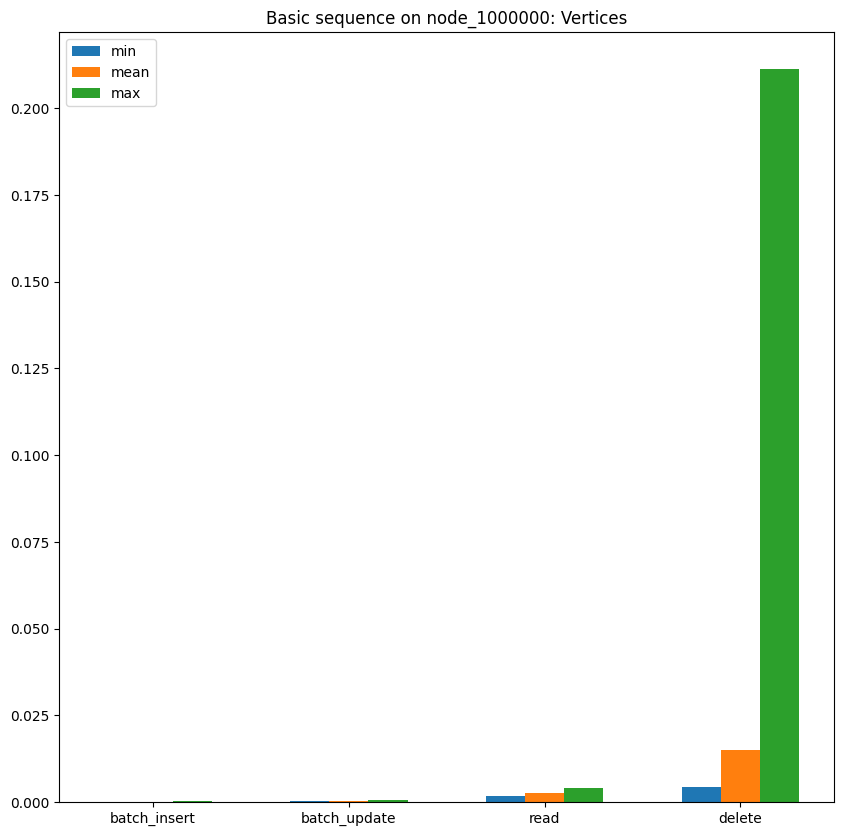

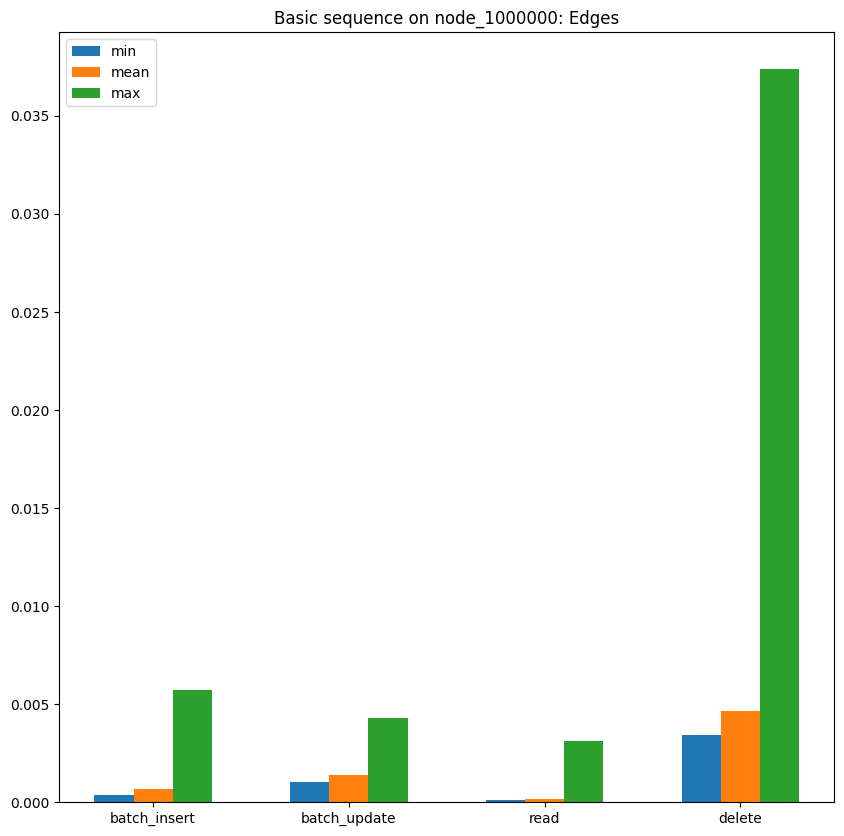

db: node_1000000
{'batch insert': {'vertices': {'max': 0.00037496685981750486, 'min': 6.799936294555664e-05, 'mean': 8.775925302505493e-05}, 'edges': {'max': 0.005704240798950195, 'min': 0.00036023616790771486, 'mean': 0.0006899039898404548}}, 'batch update': {'vertices': {'max': 0.0005116009712219238, 'min': 0.00028143882751464845, 'mean': 0.0003695173978805542}, 'edges': {'max': 0.004311795234680176, 'min': 0.001015472412109375, 'mean': 0.001364182767868042}}, 'read': {'edges': {'mean': 0.00017352982416141165, 'max': 0.0031044483184814453, 'min': 8.684396743774414e-05, 'total_time': 0.9836282730102539}, 'vertices': {'mean': 0.0024916791915893556, 'max': 0.004175901412963867, 'min': 0.0018885135650634766, 'total_time': 0.2495100498199463}}, 'delete': {'edges': {'mean': 0.004638224845623485, 'max': 0.03739333152770996, 'min': 0.003414630889892578, 'total_time': 52.883519411087036}, 'vertices': {'mean': 0.014967966079711913, 'max': 0.21138739585876465, 'min': 0.004274129867553711, 'tota

In [5]:
results = {}
time = []

results["node_1000000"] = execute_database("node_1000000", large=True, time=time)
print("db:", "node_1000000")
print(results["node_1000000"])

In [7]:
results

{}

In [5]:
def execute_traverser(database, source, target, max_depth):
    hg = PyHugeGraphClient.HugeGraphClient("http://localhost", "8081", database)
    
    time = []
    def mapping(l, key_2):
        return list(map(lambda x: x[key_2], l))

    time.append(traversers.traverser_shortest_path(hg, source=source, target=target, max_depth=10000))
    time.append(traversers.traverser_kout(hg, source=source, max_depth=max_depth, nearest="true"))
    time.append(traversers.traverser_kneighbor(hg, source=source, max_depth=max_depth))
        
    x_labels = ["Shortest Path", "Kout", "Kneighbor"]

    # print(mapping(time, "response"))

    X_axis = np.arange(len(x_labels))*2
    
    plt.figure(figsize=(10,10))
    title = "Traversers timing"
    plt.title(title)

    plt.xticks(X_axis, x_labels) #, rotation=45
    plt.bar(X_axis, mapping(time, "time"), 0.4)
    
    plt.savefig(my_path + "/plots/" + database + "/" + title + ".png")
    plt.legend()

    
    plt.show()
    return {
        "Shortest Path": time[0],
        "Kout": time[1],
        "Kneighbor": time[2],
    }

results_traversers = {}

In [7]:
import sys

# reload(sys)
# sys.setdefaultencoding("utf-8")


class Response(object):
    """
        获得响应内容和状态码
    """
    def __init__(self, status_code, result):
        self.status_code = status_code
        self.response = result


In [15]:
import requests

headers = {
            'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; WOW64) AppleWebKit/537.36 '
                          '(KHTML, like Gecko) Chrome/57.0.2987.133 Safari/537.36',
            'Content-Type': 'application/json'
        }

def traverser_kout(graph, source, direction, max_depth, label="", nearest="true"):

        url = "http://localhost:8081/graphs" + "/" + graph + "/traversers/kout?"
        para = ""
        if source == "":
            return Response(400, "source can not be empty")
        else:
            para = para + "&source=\"" + source + "\""
        if direction == "":
            return Response(400, "direction can not be empty")
        else:
            para = para + "&direction=" + direction
        if max_depth == "":
            return Response(400, "depth can not be empty")
        else:
            para = para + "&max_depth=" + str(max_depth)
        if label != "":
            para = para + "&label=" + label
        if nearest != "":
            para = para + "&nearest=" + nearest

        url = url + para[1:]
        response = requests.get(url, headers=headers)
        res = Response(response.status_code, response.content)
        return res

def traverser_kneighbor(graph, source, direction, max_depth, label=""):

    url = "http://localhost:8081/graphs" + "/" + graph + "/traversers/kneighbor?"
    para = ""
    if source == "":
        return Response(400, "source can not be empty")
    else:
        para = para + "&source=\"" + source + "\""
    if direction == "":
        return Response(400, "direction can not be empty")
    else:
        para = para + "&direction=" + direction
    if max_depth == "":
        return Response(400, "depth can not be empty")
    else:
        para = para + "&max_depth=" + str(max_depth)
    if label != "":
        para = para + "&label=" + label

    url = url + para[1:]
    response = requests.get(url, headers=headers)
    res = Response(response.status_code, response.content)
    return res

[(b'{"path": ["1:1","1:2","1:4"]}', 200), (b'{"vertices": ["1:6","1:4"]}', 200), (b'{"vertices": ["1:10","1:9","1:8","1:7","1:6","1:5","1:4","1:3","1:2"]}', 200)]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


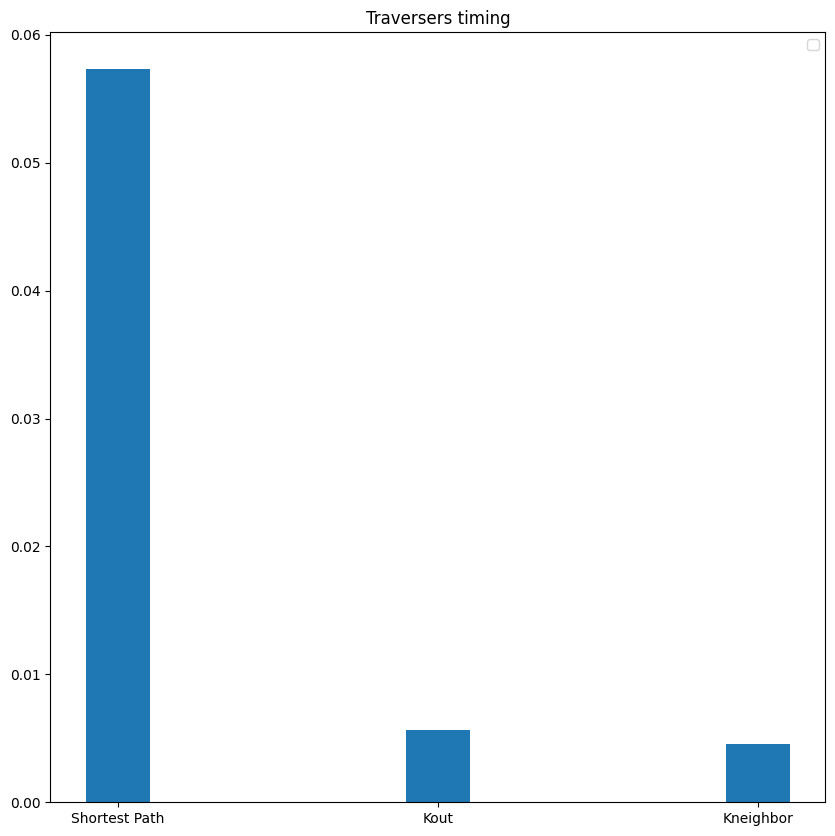

{'Shortest Path': {'response': (b'{"path": ["1:1","1:2","1:4"]}', 200), 'time': 0.05733942985534668}, 'Kout': {'response': (b'{"vertices": ["1:6","1:4"]}', 200), 'time': 0.005659818649291992}, 'Kneighbor': {'response': (b'{"vertices": ["1:10","1:9","1:8","1:7","1:6","1:5","1:4","1:3","1:2"]}', 200), 'time': 0.004595756530761719}}


In [50]:


results_traversers["node_10"] = execute_traverser("node_10", source="1:1", target="1:4", max_depth=2)
print(results_traversers["node_10"])

[(b'{"path": ["1:1","1:85","1:50"]}', 200), (b'{"vertices": ["1:21","1:83","1:39","1:36","1:43","1:62","1:26","1:32","1:8","1:78","1:59","1:58","1:90","1:18","1:94"]}', 200), (b'{"vertices": ["1:38","1:39","1:36","1:37","1:34","1:35","1:32","1:33","1:30","1:31","1:47","1:48","1:49","1:43","1:44","1:45","1:46","1:40","1:41","1:42","1:12","1:13","1:10","1:11","1:16","1:17","1:14","1:15","1:98","1:99","1:90","1:91","1:19","1:92","1:93","1:18","1:94","1:95","1:96","1:97","1:21","1:22","1:23","1:24","1:25","1:26","1:27","1:28","1:20","1:29","1:75","1:74","1:73","1:72","1:71","1:70","1:79","1:78","1:77","1:76","1:84","1:83","1:86","1:85","1:80","1:82","1:81","1:8","1:7","1:6","1:5","1:4","1:88","1:3","1:87","1:2","1:89","1:9","1:53","1:52","1:51","1:50","1:57","1:56","1:55","1:54","1:59","1:100","1:58","1:60","1:62","1:61","1:64","1:63","1:66","1:65","1:68","1:67","1:69"]}', 200)]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


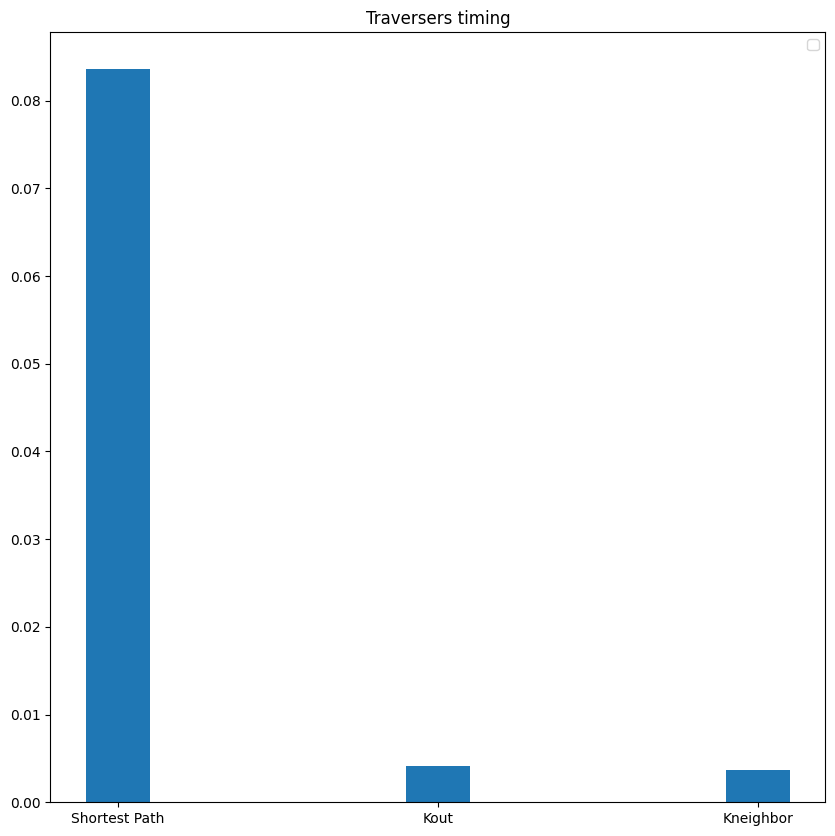

{'Shortest Path': {'response': (b'{"path": ["1:1","1:85","1:50"]}', 200), 'time': 0.08362126350402832}, 'Kout': {'response': (b'{"vertices": ["1:21","1:83","1:39","1:36","1:43","1:62","1:26","1:32","1:8","1:78","1:59","1:58","1:90","1:18","1:94"]}', 200), 'time': 0.004143953323364258}, 'Kneighbor': {'response': (b'{"vertices": ["1:38","1:39","1:36","1:37","1:34","1:35","1:32","1:33","1:30","1:31","1:47","1:48","1:49","1:43","1:44","1:45","1:46","1:40","1:41","1:42","1:12","1:13","1:10","1:11","1:16","1:17","1:14","1:15","1:98","1:99","1:90","1:91","1:19","1:92","1:93","1:18","1:94","1:95","1:96","1:97","1:21","1:22","1:23","1:24","1:25","1:26","1:27","1:28","1:20","1:29","1:75","1:74","1:73","1:72","1:71","1:70","1:79","1:78","1:77","1:76","1:84","1:83","1:86","1:85","1:80","1:82","1:81","1:8","1:7","1:6","1:5","1:4","1:88","1:3","1:87","1:2","1:89","1:9","1:53","1:52","1:51","1:50","1:57","1:56","1:55","1:54","1:59","1:100","1:58","1:60","1:62","1:61","1:64","1:63","1:66","1:65","1:68

In [45]:
results_traversers["node_100"] = execute_traverser("node_100", source="1:1", target="1:50", max_depth=3)
print(results_traversers["node_100"])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[(b'{"path": ["1:1","1:140","1:1000"]}', 200), (b'{"vertices": ["1:246","1:312","1:166","1:213","1:829","1:750","1:420","1:895","1:485","1:361","1:388","1:908","1:879","1:947","1:811","1:174"]}', 200), (b'{"vertices": ["1:884","1:883","1:882","1:881","1:888","1:887","1:886","1:885","1:880","1:476","1:477","1:474","1:475","1:478","1:479","1:889","1:472","1:473","1:470","1:471","1:871","1:870","1:873","1:872","1:875","1:874","1:877","1:876","1:485","1:486","1:487","1:488","1:489","1:878","1:879","1:480","1:481","1:482","1:483","1:484","1:866","1:865","1:864","1:863","1:862","1:861","1:860","1:458","1:459","1:456","1:457","1:454","1:455","1:452","1:453","1:450","1:451","1:869","1:867","1:868","1:853","1:852","1:855","1:854","1:851","1:850","1:467","1:468","1:469","1:463","1:464","1:465","1:466","1:460","1:461","1:462","1:856","1:857","1:858","1:859","1:179","1:178","1:177","1:172","1:171","1:170","1:176","1:175","1:174","1:173","1:190","1:189","1:188","1:181","1:180","1:183","1:182","1:18

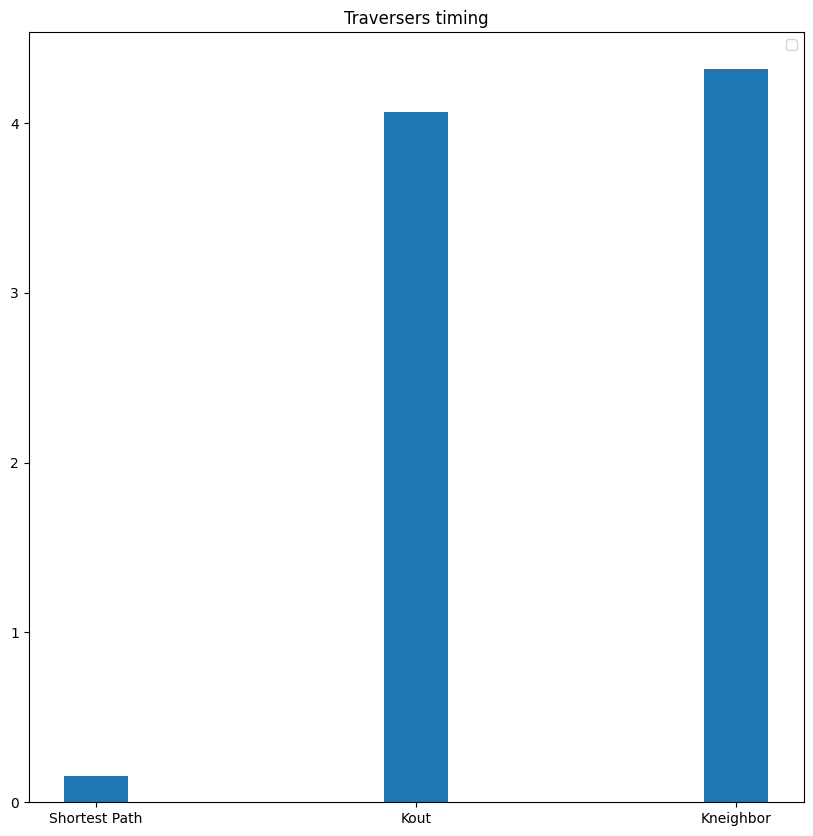

{'Shortest Path': {'response': (b'{"path": ["1:1","1:140","1:1000"]}', 200), 'time': 0.15766143798828125}, 'Kout': {'response': (b'{"vertices": ["1:246","1:312","1:166","1:213","1:829","1:750","1:420","1:895","1:485","1:361","1:388","1:908","1:879","1:947","1:811","1:174"]}', 200), 'time': 4.065305709838867}, 'Kneighbor': {'response': (b'{"vertices": ["1:884","1:883","1:882","1:881","1:888","1:887","1:886","1:885","1:880","1:476","1:477","1:474","1:475","1:478","1:479","1:889","1:472","1:473","1:470","1:471","1:871","1:870","1:873","1:872","1:875","1:874","1:877","1:876","1:485","1:486","1:487","1:488","1:489","1:878","1:879","1:480","1:481","1:482","1:483","1:484","1:866","1:865","1:864","1:863","1:862","1:861","1:860","1:458","1:459","1:456","1:457","1:454","1:455","1:452","1:453","1:450","1:451","1:869","1:867","1:868","1:853","1:852","1:855","1:854","1:851","1:850","1:467","1:468","1:469","1:463","1:464","1:465","1:466","1:460","1:461","1:462","1:856","1:857","1:858","1:859","1:179

In [38]:
results_traversers["node_1000"] = execute_traverser("node_1000", source="1:1", target="1:1000", max_depth=3)
print(results_traversers["node_1000"])

[(b'{"path": ["1:600","1:6561","1:302","1:1927","1:10000"]}', 200), (b'{"vertices": ["1:699","1:696","1:695","1:693","1:690","1:691","1:671","1:670","1:673","1:672","1:674","1:676","1:678","1:682","1:681","1:680","1:685","1:684","1:683","1:689","1:688","1:687","1:658","1:659","1:655","1:654","1:657","1:656","1:651","1:650","1:653","1:652","1:669","1:660","1:667","1:666","1:665","1:664","1:662","1:661","1:637","1:636","1:639","1:630","1:631","1:632","1:633","1:634","1:635","1:649","1:648","1:647","1:641","1:640","1:645","1:646","1:643","1:644","1:619","1:618","1:615","1:614","1:617","1:616","1:610","1:613","1:629","1:628","1:627","1:626","1:623","1:624","1:621","1:622","1:3989","1:1606","1:1609","1:1608","1:601","1:1603","1:1605","1:1604","1:608","1:609","1:1600","1:1601","1:603","1:604","1:605","1:606","1:3987","1:3988","1:3983","1:3984","1:3981","1:3982","1:1619","1:1617","1:1615","1:1613","1:1611","1:1612","1:6693","1:3990","1:1610","1:3991","1:6691","1:6696","1:6697","1:6694","1:669

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


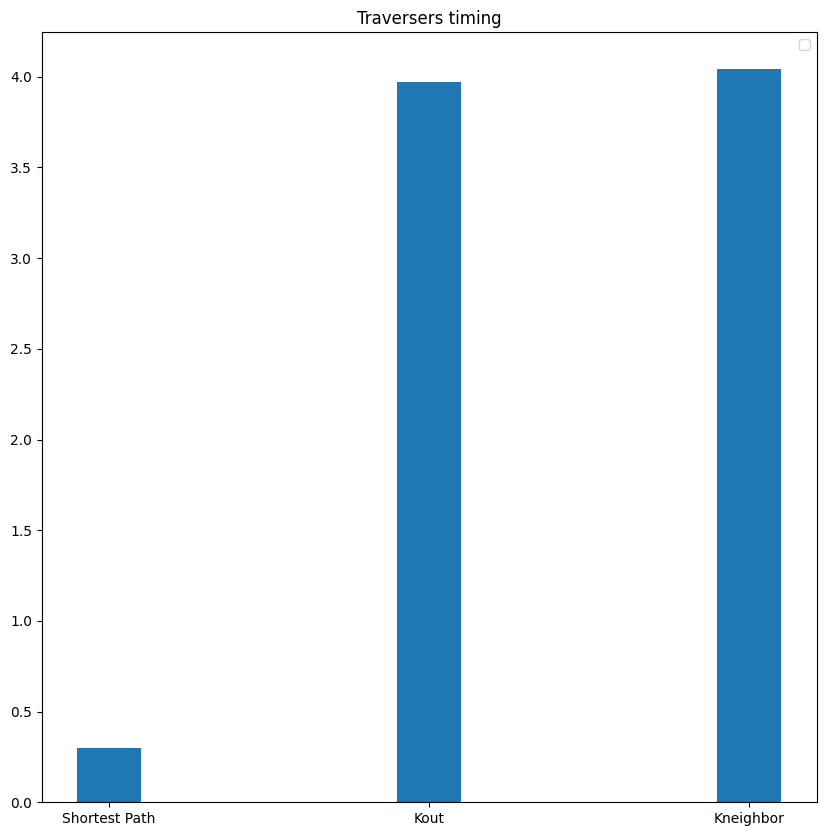

{'Shortest Path': {'response': (b'{"path": ["1:600","1:6561","1:302","1:1927","1:10000"]}', 200), 'time': 0.2985560894012451}, 'Kout': {'response': (b'{"vertices": ["1:699","1:696","1:695","1:693","1:690","1:691","1:671","1:670","1:673","1:672","1:674","1:676","1:678","1:682","1:681","1:680","1:685","1:684","1:683","1:689","1:688","1:687","1:658","1:659","1:655","1:654","1:657","1:656","1:651","1:650","1:653","1:652","1:669","1:660","1:667","1:666","1:665","1:664","1:662","1:661","1:637","1:636","1:639","1:630","1:631","1:632","1:633","1:634","1:635","1:649","1:648","1:647","1:641","1:640","1:645","1:646","1:643","1:644","1:619","1:618","1:615","1:614","1:617","1:616","1:610","1:613","1:629","1:628","1:627","1:626","1:623","1:624","1:621","1:622","1:3989","1:1606","1:1609","1:1608","1:601","1:1603","1:1605","1:1604","1:608","1:609","1:1600","1:1601","1:603","1:604","1:605","1:606","1:3987","1:3988","1:3983","1:3984","1:3981","1:3982","1:1619","1:1617","1:1615","1:1613","1:1611","1:1612

In [32]:
results_traversers["node_10000"] = execute_traverser("node_10000", source="1:600", target="1:10000", max_depth=3)
print(results_traversers["node_10000"])

[(b'{"path": ["1:600","1:151","1:13155","1:17028","1:100000"]}', 200), (b'{"vertices": ["1:21974","1:21975","1:21972","1:35744","1:21973","1:35742","1:96632","1:96631","1:96633","1:21979","1:47161","1:47162","1:18198","1:47182","1:21962","1:47179","1:94505","1:21966","1:21968","1:21967","1:94507","1:21992","1:35720","1:21990","1:96610","1:35725","1:21997","1:21994","1:35722","1:35729","1:96616","1:21999","1:96611","1:47145","1:96619","1:35730","1:21980","1:21982","1:35733","1:21984","1:21985","1:21988","1:47153","1:35738","1:35739","1:21989","1:96627","1:47156","1:96624","1:96625","1:47154","1:21931","1:21930","1:35703","1:35700","1:96672","1:47125","1:21938","1:21939","1:21936","1:94537","1:47124","1:35706","1:21933","1:35704","1:96687","1:61378","1:21929","1:47137","1:47135","1:35719","1:21927","1:21928","1:96688","1:21923","1:35718","1:21924","1:21953","1:21952","1:21950","1:96650","1:61386","1:61383","1:53191","1:21957","1:94510","1:53197","1:21940","1:21941","1:94529","1:94522","1

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


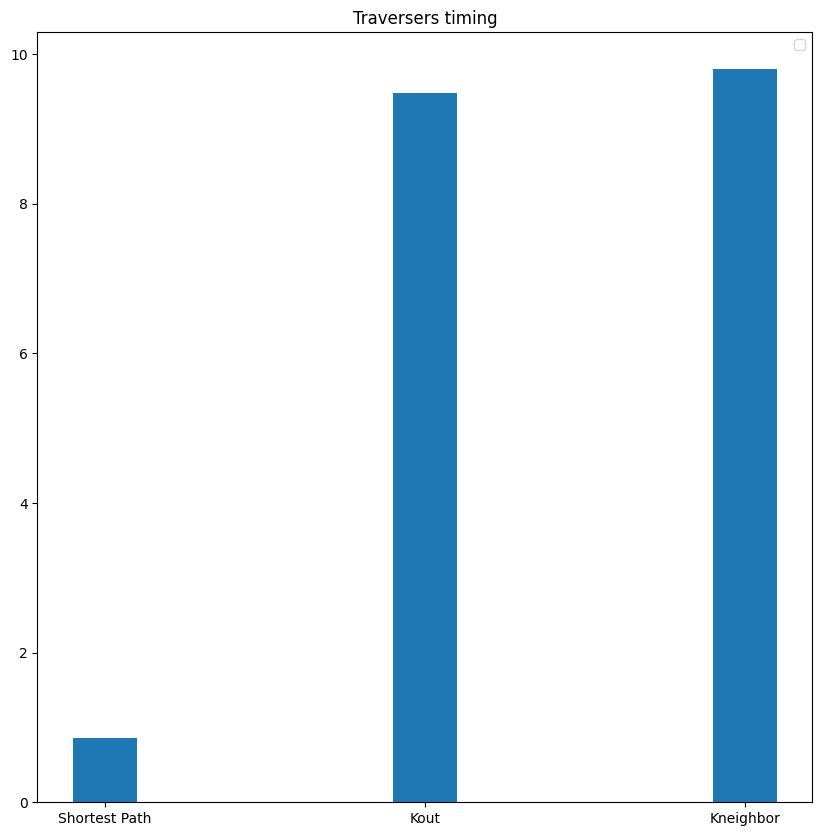

{'Shortest Path': {'response': (b'{"path": ["1:600","1:151","1:13155","1:17028","1:100000"]}', 200), 'time': 0.8544650077819824}, 'Kout': {'response': (b'{"vertices": ["1:21974","1:21975","1:21972","1:35744","1:21973","1:35742","1:96632","1:96631","1:96633","1:21979","1:47161","1:47162","1:18198","1:47182","1:21962","1:47179","1:94505","1:21966","1:21968","1:21967","1:94507","1:21992","1:35720","1:21990","1:96610","1:35725","1:21997","1:21994","1:35722","1:35729","1:96616","1:21999","1:96611","1:47145","1:96619","1:35730","1:21980","1:21982","1:35733","1:21984","1:21985","1:21988","1:47153","1:35738","1:35739","1:21989","1:96627","1:47156","1:96624","1:96625","1:47154","1:21931","1:21930","1:35703","1:35700","1:96672","1:47125","1:21938","1:21939","1:21936","1:94537","1:47124","1:35706","1:21933","1:35704","1:96687","1:61378","1:21929","1:47137","1:47135","1:35719","1:21927","1:21928","1:96688","1:21923","1:35718","1:21924","1:21953","1:21952","1:21950","1:96650","1:61386","1:61383","1

In [30]:
results_traversers["node_100000"] = execute_traverser("node_100000", source="1:600", target="1:100000", max_depth=3)
print(results_traversers["node_100000"])

[(b'{"path": ["1:600","1:554","1:1328","1:14643","1:132435"]}', 200), (b'{"vertices": ["1:653191","1:653192","1:736671","1:714993","1:124950","1:714996","1:124954","1:47165","1:47166","1:434006","1:457204","1:47168","1:457203","1:47161","1:530463","1:234330","1:234331","1:530466","1:234332","1:653183","1:530462","1:653188","1:234339","1:992457","1:653187","1:434001","1:653186","1:284904","1:736681","1:284901","1:47182","1:929340","1:47180","1:714986","1:47178","1:124947","1:457215","1:47176","1:47174","1:234340","1:518101","1:47172","1:47173","1:234342","1:992441","1:530470","1:992443","1:234347","1:234348","1:992445","1:653197","1:189108","1:189114","1:929371","1:992439","1:124933","1:518103","1:189110","1:635504","1:124938","1:47140","1:518110","1:47143","1:47144","1:457227","1:457226","1:124937","1:736646","1:234317","1:47148","1:992435","1:992434","1:736642","1:234311","1:992430","1:189122","1:189123","1:189124","1:189125","1:992427","1:234329","1:992428","1:189127","1:189128","1:1

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


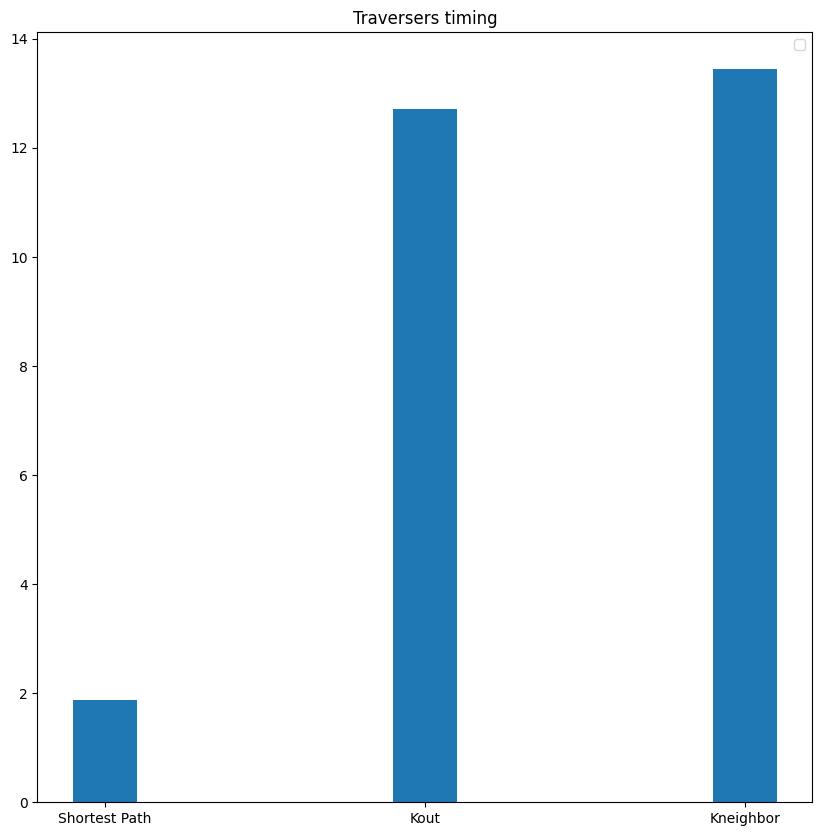

{'Shortest Path': {'response': (b'{"path": ["1:600","1:554","1:1328","1:14643","1:132435"]}', 200), 'time': 1.8818209171295166}, 'Kout': {'response': (b'{"vertices": ["1:653191","1:653192","1:736671","1:714993","1:124950","1:714996","1:124954","1:47165","1:47166","1:434006","1:457204","1:47168","1:457203","1:47161","1:530463","1:234330","1:234331","1:530466","1:234332","1:653183","1:530462","1:653188","1:234339","1:992457","1:653187","1:434001","1:653186","1:284904","1:736681","1:284901","1:47182","1:929340","1:47180","1:714986","1:47178","1:124947","1:457215","1:47176","1:47174","1:234340","1:518101","1:47172","1:47173","1:234342","1:992441","1:530470","1:992443","1:234347","1:234348","1:992445","1:653197","1:189108","1:189114","1:929371","1:992439","1:124933","1:518103","1:189110","1:635504","1:124938","1:47140","1:518110","1:47143","1:47144","1:457227","1:457226","1:124937","1:736646","1:234317","1:47148","1:992435","1:992434","1:736642","1:234311","1:992430","1:189122","1:189123","

In [29]:
results_traversers["node_1000000"] = execute_traverser("node_1000000", source="1:600", target="1:132435", max_depth=3)
print(results_traversers["node_1000000"])
print("Kout", len(list(results_traversers["node_1000000"]["Kout"]["response"][0])))
print("Kneighbor", len(list(results_traversers["node_1000000"]["Kneighbor"]["response"][0])))